# Machine and Statistical Learning Project

**Mariana Montserrat Cerra, Juan Esteban Cruz, Léonie Lorcher** $-$ M2 EBDS $-$ 2022-2023

In [2]:
import numpy as np
import pandas as pd
import numpy as np

from sklearn.linear_model import Lasso, ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, confusion_matrix
from sklearn.model_selection import cross_val_score, train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.inspection import permutation_importance

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

pd.options.mode.chained_assignment = None

The following dataset has already merged the databases of households and individuals, and it already contains the target variable which is 'index' (calculated in R)

In [3]:
path = '/Users/leonielorcher/Desktop/ Mag3/ ML final project/'
df = pd.read_csv(path+'Database_with_index.csv', sep=';', low_memory=False)
df

,Unnamed: 0,CODUSU,NRO_HOGAR,ANO4,TRIMESTRE,COMPONENTE,H15,REGION,MAS_500,AGLOMERADO,...,VII2_3,VII2_4,Periodo,adequi,Region,CBA,CBT,Adequi_hogar,Situacion,index
0,1,TQRMNOPPQHJKLLCDEGOIH00783953,1,2022,2,2,1,40,N,18,...,0,0,2022.2,"0,85",Noroeste,"20183,3947","41981,4637666667","1,61",No.Pobre,"3,33480511251635"
1,2,TQRMNOPPQHJKLLCDEGOIH00783953,1,2022,2,1,1,40,N,18,...,0,0,2022.2,"0,76",Noroeste,"20183,3947","41981,4637666667","1,61",No.Pobre,"3,33480511251635"
2,3,TQRMNOPPQHJKTMCDEIJAH00786549,1,2022,2,3,1,1,S,33,...,0,0,2022.2,"1,02",GBA,"40194,9348","90036,648","2,79",Pobre,"0,888527080661643"
3,4,TQRMNOPPQHJKTMCDEIJAH00786549,1,2022,2,1,1,1,S,33,...,0,0,2022.2,1,GBA,"40194,9348","90036,648","2,79",Pobre,"0,888527080661643"
4,5,TQRMNOPPQHJKTMCDEIJAH00786549,1,2022,2,2,1,1,S,33,...,0,0,2022.2,"0,77",GBA,"40194,9348","90036,648","2,79",Pobre,"0,888527080661643"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50609,50610,TQVMNOSQUHMMKSCDEHJGH00701569,1,2022,2,2,1,40,S,23,...,0,0,2022.2,"0,76",Noroeste,"68824,1223","143154,1839","5,49",Indigente,"0,454055887359922"
50610,50611,TQVMNOSQUHMMKSCDEHJGH00701569,1,2022,2,3,1,40,S,23,...,0,0,2022.2,"0,76",Noroeste,"68824,1223","143154,1839","5,49",Indigente,"0,454055887359922"
50611,50612,TQVMNOSQUHMMKSCDEHJGH00701569,1,2022,2,4,1,40,S,23,...,0,0,2022.2,"0,76",Noroeste,"68824,1223","143154,1839","5,49",Indigente,"0,454055887359922"
50612,50613,TQVMNOSQUHMMKSCDEHJGH00701569,1,2022,2,1,1,40,S,23,...,0,0,2022.2,1,Noroeste,"68824,1223","143154,1839","5,49",Indigente,"0,454055887359922"


In [3]:
print('The dataset has',len(df),'rows (observations) and',len(df.columns),'columns (variables).')

The dataset has 50614 rows (observations) and 251 columns (variables).


# 1. Data Cleaning

### 1.1 Keep only the variables of our interest

In [4]:
df = df[['ITF','NIVEL_ED','CH07','CH03','CH06','CH04','CAT_INAC','ESTADO','CAT_OCUP','IV3','IV4','IV1','II4_1',
         'II4_2','II4_3','II5','II6','II8','II9','IV11','IV6','IV12_1','IV12_2','IV12_3','IX_TOT','II1',
         'AGLOMERADO','REGION','CH08','II7','CH09','V1','V2','V3','V4','V5','V6','V7','V8','V9','V10','V11',
         'V12','V13','V14', 'V15','V2_M','V5_M','V8_M','V10_M','V12_M','Situacion','index']]
df

,ITF,NIVEL_ED,CH07,CH03,CH06,CH04,CAT_INAC,ESTADO,CAT_OCUP,IV3,...,V13,V14,V15,V2_M,V5_M,V8_M,V10_M,V12_M,Situacion,index
0,140000,1,5,3,12,1,3,3,0,1,...,2,2,2,0,0,0,0,0,No.Pobre,"3,33480511251635"
1,140000,6,5,1,55,2,0,1,3,1,...,2,2,2,0,0,0,0,0,No.Pobre,"3,33480511251635"
2,80000,4,5,3,20,1,7,3,0,1,...,1,2,2,0,0,0,0,0,Pobre,"0,888527080661643"
3,80000,4,1,1,52,1,0,1,1,1,...,1,2,2,0,0,0,0,0,Pobre,"0,888527080661643"
4,80000,4,1,2,43,2,0,1,3,1,...,1,2,2,0,0,0,0,0,Pobre,"0,888527080661643"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50609,65000,3,2,2,48,2,4,3,0,1,...,2,1,2,0,0,0,0,0,Indigente,"0,454055887359922"
50610,65000,5,5,3,23,2,0,1,3,1,...,2,1,2,0,0,0,0,0,Indigente,"0,454055887359922"
50611,65000,5,5,3,21,2,3,3,0,1,...,2,1,2,0,0,0,0,0,Indigente,"0,454055887359922"
50612,65000,4,2,1,49,1,0,1,3,1,...,2,1,2,0,0,0,0,0,Indigente,"0,454055887359922"


### 1.2 Rename the variables 

In [5]:
#Rename the variables of our interest
df.rename(columns = {'CH07':'marital_status', 'CH03':'household_role', 'CH06':'age','CH04':'sex',
                       'IV3':'floor_type', 'IV4':'roof_type','IV1':'housing_type', 'II4_1':'kitchen',
                       'II4_2':'laundry','II4_3':'garage', 'II5':'room_to_sleep', 'II6':'room_to_work',
                       'II8':'Fuel_for_cooking', 'II9':'bathroom', 'IV11':'sewerage', 'IV6':'access_to_water', 
                       'IV12_1':'trash_nearby', 'IV12_2':'floods_zone', 'IV12_3':'shantytown', 
                       'IX_TOT':'nb_people_per_house', 'II1':'nb_rooms', 'CH08':'social_security_type', 
                       'II7':'property_ownership_regime','CH09':'literate', 'V1':'lived_from_work_earnings',
                       'V2':'lived_from_retirement', 'V3':'lived_from_severance_pay',
                       'V4':'lived_from_unemployment_insurance', 'V5':'lived_from_social_assistance', 
                       'V6':'lived_from_clothing_food_gov', 'V7':'lived_from_clothing_food_family', 
                       'V8':'lived_from_rent_own_property', 'V9':'lived_from_business_earnings', 
                       'V10':'lived_from_investments', 'V11':'lived_from_scholarship','V12':'lived_from_cash_family', 
                       'V13':'lived_from_savings','V14':'lived_from_loans_family', 'V15':'lived_from_loans_bank', 
                       'V2_M':'retirement_income', 'V5_M':'government_aid_income','V8_M':'rent_own_property_income', 
                       'V10_M':'investments_income', 'V12_M':'aid_family_income',
                       'Situacion':'poor_category'}, inplace = True)
df

,ITF,NIVEL_ED,marital_status,household_role,age,sex,CAT_INAC,ESTADO,CAT_OCUP,floor_type,...,lived_from_savings,lived_from_loans_family,lived_from_loans_bank,retirement_income,government_aid_income,rent_own_property_income,investments_income,aid_family_income,poor_category,index
0,140000,1,5,3,12,1,3,3,0,1,...,2,2,2,0,0,0,0,0,No.Pobre,"3,33480511251635"
1,140000,6,5,1,55,2,0,1,3,1,...,2,2,2,0,0,0,0,0,No.Pobre,"3,33480511251635"
2,80000,4,5,3,20,1,7,3,0,1,...,1,2,2,0,0,0,0,0,Pobre,"0,888527080661643"
3,80000,4,1,1,52,1,0,1,1,1,...,1,2,2,0,0,0,0,0,Pobre,"0,888527080661643"
4,80000,4,1,2,43,2,0,1,3,1,...,1,2,2,0,0,0,0,0,Pobre,"0,888527080661643"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50609,65000,3,2,2,48,2,4,3,0,1,...,2,1,2,0,0,0,0,0,Indigente,"0,454055887359922"
50610,65000,5,5,3,23,2,0,1,3,1,...,2,1,2,0,0,0,0,0,Indigente,"0,454055887359922"
50611,65000,5,5,3,21,2,3,3,0,1,...,2,1,2,0,0,0,0,0,Indigente,"0,454055887359922"
50612,65000,4,2,1,49,1,0,1,3,1,...,2,1,2,0,0,0,0,0,Indigente,"0,454055887359922"


In [6]:
print('The dataset has',len(df),'rows (observations) and',len(df.columns),'columns (variables).')

The dataset has 50614 rows (observations) and 53 columns (variables).


### 1.3 Remove and replace values in variables

In [7]:
# Remove people who did not answer their income
df = df[df['ITF'] > 0]  #ITF is the total income of the family

# Restrict the age to be higher than 18
df = df[df['age'] >= 18] 

# Variable age to the square
df['age_2'] = df['age'].pow(2)

# Create overcrowding index (nb_people_per_house/nb_rooms), here nb_people_per_house is the nb of people in 
# the household, and nb_rooms the nb of rooms
df['overcrowding_index'] = df['nb_people_per_house']/df['nb_rooms'] 

# Remove no answer = 9. Then, 1= Yes & 2= No, so we replace 2 for 0 
cols_to_clean_9 = ['lived_from_work_earnings', 'lived_from_retirement', 'lived_from_severance_pay', 
               'lived_from_unemployment_insurance', 'lived_from_social_assistance', 'lived_from_clothing_food_gov', 
               'lived_from_clothing_food_family', 'lived_from_rent_own_property', 'lived_from_business_earnings', 
               'lived_from_investments', 'lived_from_scholarship', 'lived_from_cash_family', 'lived_from_savings', 
               'lived_from_loans_family', 'lived_from_loans_bank']
for col in cols_to_clean_9:
    df.drop(df[df[col] == 9].index, inplace=True)
    df[col] = df[col].replace({2: 0})
    
# Remove Code 0, which initially identifies the cases to which the analyzed sequence does not correspond.
# Then, 1= Yes & 2= No, so we replace 2 for 0 
cols_to_clean_0 = ['kitchen', 'laundry', 'garage', 'room_to_sleep', 'room_to_work']
for col in cols_to_clean_0:
    df.drop(df[df[col] == 0].index, inplace=True)
    df[col] = df[col].replace({2: 0})
    
# Drop no answer = 9
cols_to_remove_9 = ['NIVEL_ED', 'marital_status', 'CAT_OCUP', 'social_security_type', 'literate']
for col in cols_to_remove_9:
    df.drop(df[df[col] == 9].index, inplace=True)
    
# 1= Yes & 2= No, so we replace 2 for 0. And 1= men & 2= women, so we replace 2 for 0 in women
cols_to_replace = ['sex', 'trash_nearby', 'floods_zone', 'shantytown', 'literate']
for col in cols_to_replace:
    df[col] = df[col].replace({2: 0})
    
# Remove 5 = "Under 6 years" in inactivity category
df.drop(df[df['CAT_INAC'] == 5].index, inplace = True)

# Remove 4 = "Under 10 years" in activity condition, and 0 = no answer to individual questionnaire
df.drop(df[df['ESTADO'] == 4].index, inplace = True)
df.drop(df[df['ESTADO'] == 0].index, inplace = True)

# Remove 3 = 'under 2 years old' in literate variable
df.drop(df[df['literate'] == 3].index, inplace = True)

# Make 'index' a numerical variable
df['index'] = df['index'].str.replace(',', '.').astype(float)

In [8]:
# Create the variable log of the index to correct the skewness to the right
df['log_index'] = np.log(df['index'])+1

# Check that the number of individuals above 1 (non-poor) is the same
print((df['log_index'] > 1).sum())
print((df['index'] > 1).sum())

18706
18706


### 1.4 Deal with outliers

In [9]:
# Outliers on the non-numerical variables
df_quanti = df[['ITF', 'age', 'nb_people_per_house', 'nb_rooms', 'retirement_income', 
                'government_aid_income', 'rent_own_property_income', 'investments_income', 
                'aid_family_income', 'index', 'age_2', 'overcrowding_index']]
df_quanti.head()

,ITF,age,nb_people_per_house,nb_rooms,retirement_income,government_aid_income,rent_own_property_income,investments_income,aid_family_income,index,age_2,overcrowding_index
1,140000,55,2,3,0,0,0,0,0,3.334805,3025,0.666667
2,80000,20,3,4,0,0,0,0,0,0.888527,400,0.750000
3,80000,52,3,4,0,0,0,0,0,0.888527,2704,0.750000
4,80000,43,3,4,0,0,0,0,0,0.888527,1849,0.750000
10,79000,38,3,3,0,28000,0,0,11000,1.203560,1444,1.000000


**Index (target variable)**

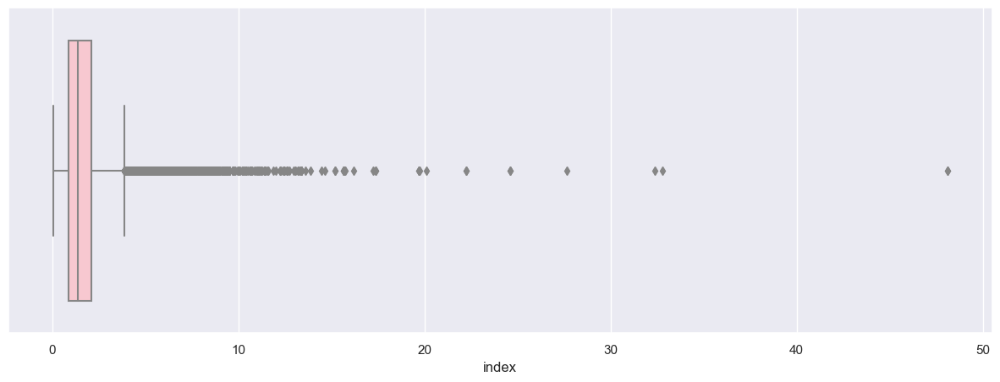

In [10]:
sns.set()
ax = plt.subplots(figsize = (15,5))
sns.boxplot(x=df['index'],color='pink')
plt.show()

In [11]:
ratio10 = round(len(df[df['index']<10])/len(df)*100,2)
ratio15 = round(len(df[df['index']<15])/len(df)*100,2)
print(ratio10, "% of the dataset have an index under 10")
print(ratio15, "% of the dataset have an index under 15")

99.66 % of the dataset have an index under 10
99.91 % of the dataset have an index under 15


We will proceed to remove observations that have an index value under 15, in case they are nonsense observations. We can afford to do this because:
1. We are loosing only 0.09% of the dataset
2. Our model's aim is to focus on poor people. Therefore, if we lose individuals with a very high income, it is not that important.

In [12]:
print("Nb of rows:", np.shape(df)[0])
print('*Removing index outliers*')
df = df[df['index']<=15]
print("Nb of rows:", np.shape(df)[0])

Nb of rows: 27071
*Removing index outliers*
Nb of rows: 27047


**Number of people per house**

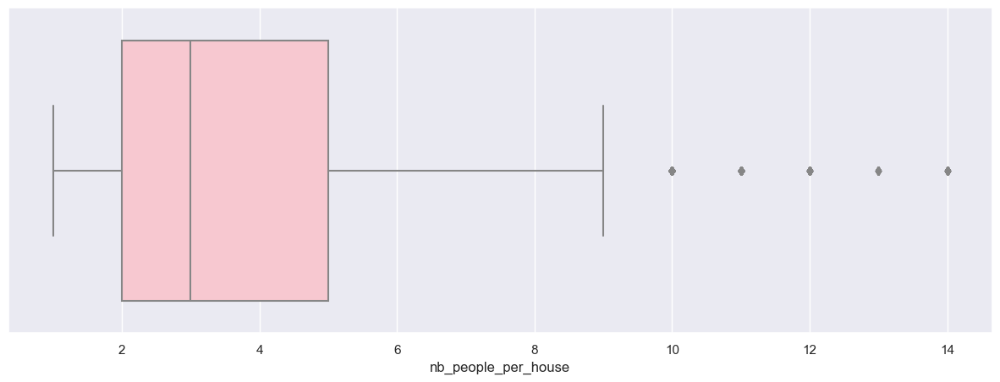

In [13]:
ax = plt.subplots(figsize = (15,5))
sns.boxplot(x=df['nb_people_per_house'],color='pink')
plt.show()

There does not seem to be any outliers in the 'Number of people per house' feature.

**Number of rooms per house**

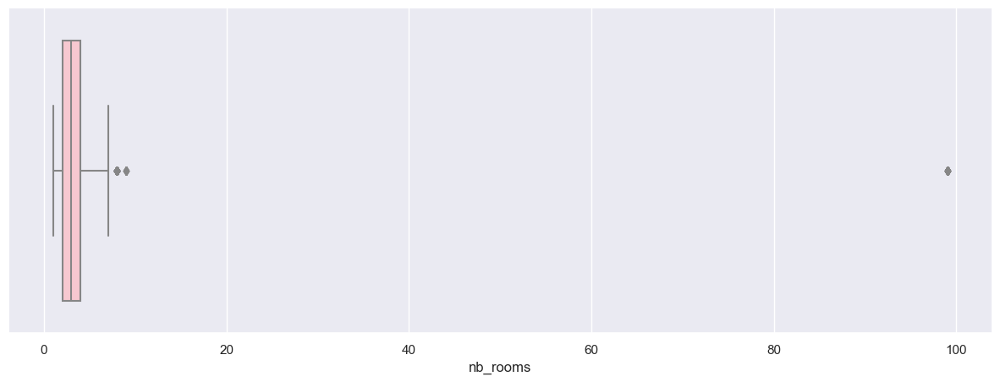

In [14]:
ax = plt.subplots(figsize = (15,5))
sns.boxplot(x=df['nb_rooms'],color='pink')
plt.show()

There seems to be nonsense values in the number of rooms.

In [15]:
df['nb_rooms'][df['nb_rooms']>10]

4826     99
4827     99
4828     99
8875     99
8876     99
13017    99
13018    99
13019    99
16685    99
16686    99
16687    99
29900    99
29901    99
29902    99
29903    99
35748    99
35749    99
35750    99
39485    99
39486    99
42043    99
42044    99
42045    99
42046    99
42047    99
42731    99
42732    99
42733    99
42734    99
42735    99
42736    99
42737    99
43815    99
46363    99
Name: nb_rooms, dtype: int64

In [16]:
# Remove observations with code 99 = no response/ does not know

print("Nb of rows:", np.shape(df)[0])
print('*Removing nb_of_rooms outliers*')
df = df[df['nb_rooms']<90]
print("Nb of rows:", np.shape(df)[0])

Nb of rows: 27047
*Removing nb_of_rooms outliers*
Nb of rows: 27013


**Retirement income**

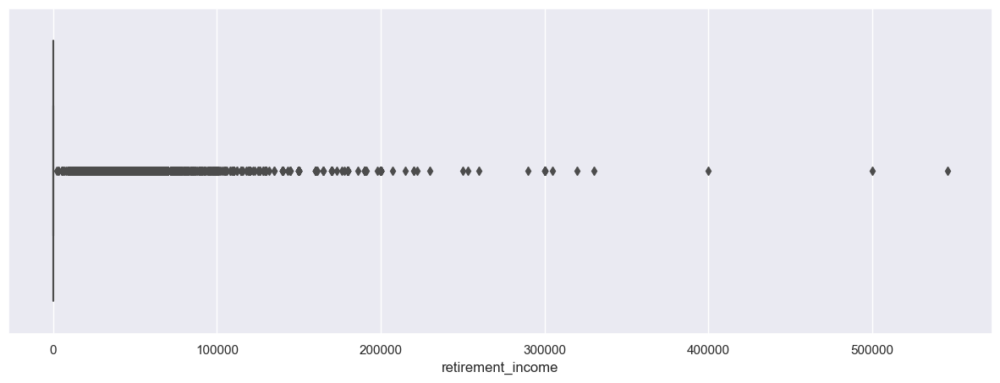

In [17]:
ax = plt.subplots(figsize = (15,5))
sns.boxplot(x=df['retirement_income'])
plt.show()

In [18]:
df[['retirement_income', 'index']][df['retirement_income']>300000]

,retirement_income,index
11143,305000,13.368779
18528,500000,12.459474
18529,330000,12.459474
19550,400000,12.732573
23162,546000,11.398389
46102,320000,3.675838


In [19]:
# Remove extreme values for retirement income.

print("Nb of rows:", np.shape(df)[0])
print('*Removing retirement_income outliers*')
df = df[df['retirement_income']<=300000]
print("Nb of rows:", np.shape(df)[0])

Nb of rows: 27013
*Removing retirement_income outliers*
Nb of rows: 27007


**Government aid income**

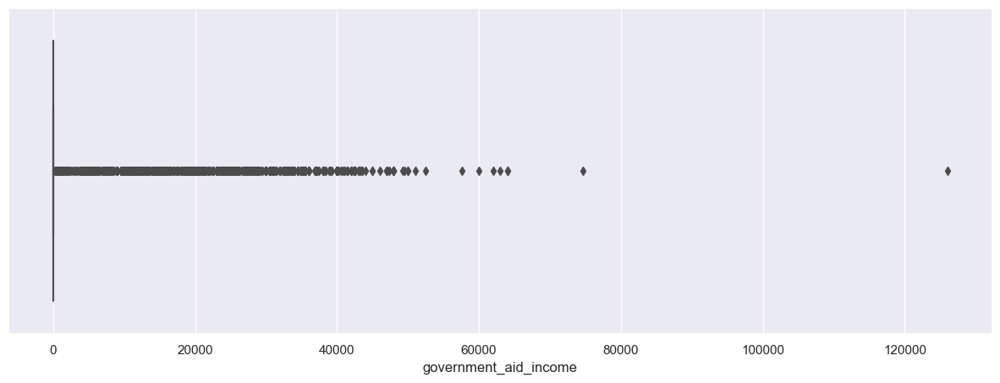

In [20]:
ax = plt.subplots(figsize = (15,5))
sns.boxplot(x=df['government_aid_income'])
plt.show()

In [21]:
df[['government_aid_income', 'index']][df['government_aid_income']>70000]

,government_aid_income,index
20399,74600,0.510959
31339,126000,1.827476


In [22]:
# Remove extreme values for government aids income.

print("Nb of rows:", np.shape(df)[0])
print('*Removing government_aid_income outliers*')
df = df[df['government_aid_income']<=120000]
print("Nb of rows:", np.shape(df)[0])

Nb of rows: 27007
*Removing government_aid_income outliers*
Nb of rows: 27006


**Rent from a property**

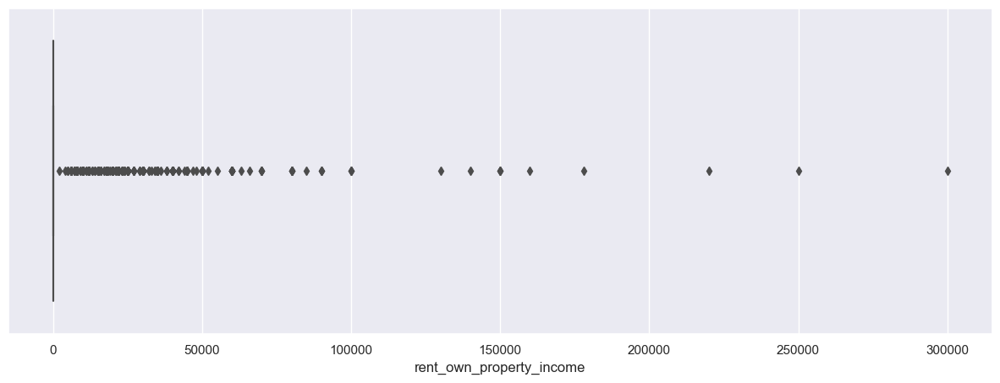

In [23]:
ax = plt.subplots(figsize = (15,5))
sns.boxplot(x=df['rent_own_property_income'])
plt.show()

In [24]:
df[['rent_own_property_income', 'index']][df['rent_own_property_income']>200000]

,rent_own_property_income,index
7461,300000,7.926027
9011,220000,8.841733
29566,250000,3.597378


In [25]:
# Remove extreme values for rents from a property income.

print("Nb of rows:", np.shape(df)[0])
print('*Removing rent_own_property_income outliers*')
df = df[df['rent_own_property_income']<=200000]
print("Nb of rows:", np.shape(df)[0])

Nb of rows: 27006
*Removing rent_own_property_income outliers*
Nb of rows: 27003


**Investment income**

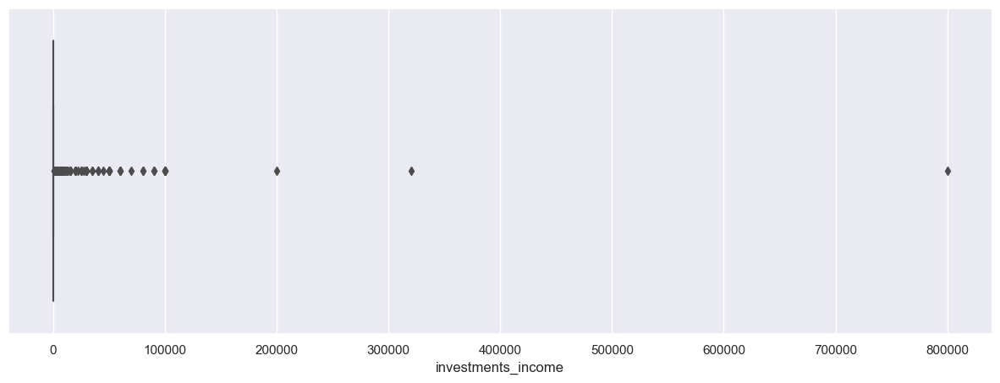

In [26]:
ax = plt.subplots(figsize = (15,5))
sns.boxplot(x=df['investments_income'])
plt.show()

There seem to be extreme values in the number of rooms. We will apply the same logic as before, with the index.

In [27]:
df[['investments_income', 'index']][df['investments_income']>100000]

,investments_income,index
15962,800000,11.253312
43430,200000,9.196205
46500,320000,10.035686


In [28]:
print("Nb of rows:", np.shape(df)[0])
print('*Removing investment income outliers*')
df = df[df['investments_income']<=100000]
print("Nb of rows:", np.shape(df)[0])

Nb of rows: 27003
*Removing investment income outliers*
Nb of rows: 27000


**Family aids income**

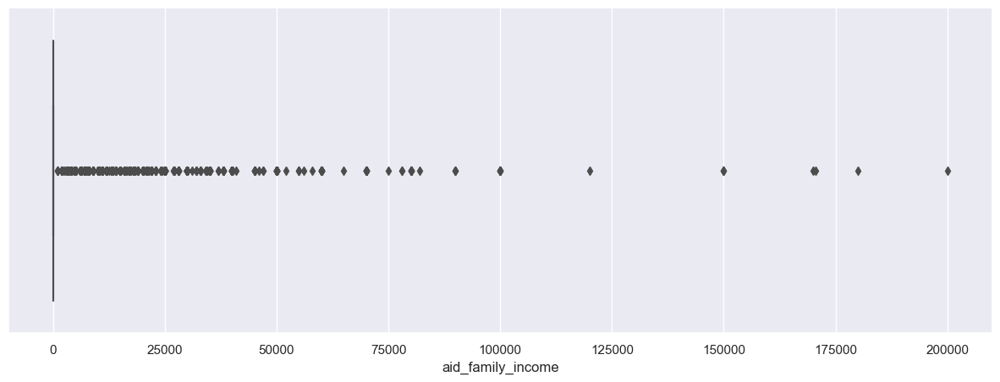

In [29]:
ax = plt.subplots(figsize = (15,5))
sns.boxplot(x=df['aid_family_income'])
plt.show()

In [30]:
df[['aid_family_income', 'index']][df['aid_family_income']>125000]

,aid_family_income,index
1019,170000,2.220869
15691,200000,2.774704
19337,150000,5.281940
19338,150000,5.281940
26750,150000,4.841778
36181,170482,9.272257
49145,180000,5.468362


In [31]:
print("Nb of rows:", np.shape(df)[0])
print('*Removing family aids income outliers*')
df = df[df['aid_family_income']<=125000]
print("Nb of rows:", np.shape(df)[0])

Nb of rows: 27000
*Removing family aids income outliers*
Nb of rows: 26993


In [32]:
df

,ITF,NIVEL_ED,marital_status,household_role,age,sex,CAT_INAC,ESTADO,CAT_OCUP,floor_type,...,retirement_income,government_aid_income,rent_own_property_income,investments_income,aid_family_income,poor_category,index,age_2,overcrowding_index,log_index
1,140000,6,5,1,55,0,0,1,3,1,...,0,0,0,0,0,No.Pobre,3.334805,3025,0.666667,2.204414
2,80000,4,5,3,20,1,7,3,0,1,...,0,0,0,0,0,Pobre,0.888527,400,0.750000,0.881810
3,80000,4,1,1,52,1,0,1,1,1,...,0,0,0,0,0,Pobre,0.888527,2704,0.750000,0.881810
4,80000,4,1,2,43,0,0,1,3,1,...,0,0,0,0,0,Pobre,0.888527,1849,0.750000,0.881810
10,79000,3,3,1,38,0,0,1,1,1,...,0,28000,0,0,11000,No.Pobre,1.203560,1444,1.000000,1.185284
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50609,65000,3,2,2,48,0,4,3,0,1,...,0,0,0,0,0,Indigente,0.454056,2304,3.500000,0.210465
50610,65000,5,5,3,23,0,0,1,3,1,...,0,0,0,0,0,Indigente,0.454056,529,3.500000,0.210465
50611,65000,5,5,3,21,0,3,3,0,1,...,0,0,0,0,0,Indigente,0.454056,441,3.500000,0.210465
50612,65000,4,2,1,49,1,0,1,3,1,...,0,0,0,0,0,Indigente,0.454056,2401,3.500000,0.210465


In [33]:
# Save as csv
df.to_csv(path+'Database_cleaned_nodummies.csv', index=False)

### 1.5 Create dummies

In [34]:
# Create dummies for selected variables
df1 = pd.get_dummies(df, columns=['NIVEL_ED','marital_status','household_role','CAT_INAC','ESTADO',
                                      'CAT_OCUP', 'floor_type','roof_type','housing_type',
                                      'Fuel_for_cooking','bathroom','sewerage','access_to_water',
                                      'AGLOMERADO','REGION','social_security_type','property_ownership_regime',
                                  'poor_category'])
df1

,ITF,age,sex,kitchen,laundry,garage,room_to_sleep,room_to_work,trash_nearby,floods_zone,...,property_ownership_regime_3,property_ownership_regime_4,property_ownership_regime_5,property_ownership_regime_6,property_ownership_regime_7,property_ownership_regime_8,property_ownership_regime_9,poor_category_Indigente,poor_category_No.Pobre,poor_category_Pobre
1,140000,55,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2,80000,20,1,0,1,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
3,80000,52,1,0,1,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
4,80000,43,0,0,1,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
10,79000,38,0,1,1,1,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50609,65000,48,0,1,0,1,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
50610,65000,23,0,1,0,1,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
50611,65000,21,0,1,0,1,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
50612,65000,49,1,1,0,1,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0


In [35]:
# Check for null values
df1.isnull().sum().sort_values(ascending = False)

ITF                    0
sewerage_4             0
access_to_water_2      0
access_to_water_3      0
AGLOMERADO_2           0
                      ..
household_role_8       0
household_role_9       0
household_role_10      0
CAT_INAC_0             0
poor_category_Pobre    0
Length: 167, dtype: int64

In [36]:
# Drop ITF
df1 = df1.drop(['ITF'], axis=1)

# Drop CAT_INAC_0 because it is the same as ESTADO_
df1 = df1.drop(['CAT_INAC_0'], axis=1)

# Drop CAT_OCUP_0 because it is the same as ESTADO_
df1 = df1.drop(['CAT_OCUP_0'], axis=1)

In [37]:
# Check that the dummy variables take only 2 values.
df_dummies = df1.drop(['age', 'nb_people_per_house', 'nb_rooms', 'retirement_income', 
                      'government_aid_income', 'rent_own_property_income', 'investments_income', 
                      'aid_family_income', 'index', 'age_2', 'overcrowding_index'], axis=1)

nb_uniques = pd.DataFrame(df_dummies.nunique(), columns=['nb of uniques'])
print(nb_uniques.to_string())

                                   nb of uniques
sex                                            2
kitchen                                        2
laundry                                        2
garage                                         2
room_to_sleep                                  2
room_to_work                                   2
trash_nearby                                   2
floods_zone                                    2
shantytown                                     2
literate                                       2
lived_from_work_earnings                       2
lived_from_retirement                          2
lived_from_severance_pay                       2
lived_from_unemployment_insurance              2
lived_from_social_assistance                   2
lived_from_clothing_food_gov                   2
lived_from_clothing_food_family                2
lived_from_rent_own_property                   2
lived_from_business_earnings                   2
lived_from_investmen

In [38]:
# Save as csv
df1.to_csv(path+'Database_cleaned.csv', index=False)

# 2. Exploratory Data Analysis (EDA)

### Index

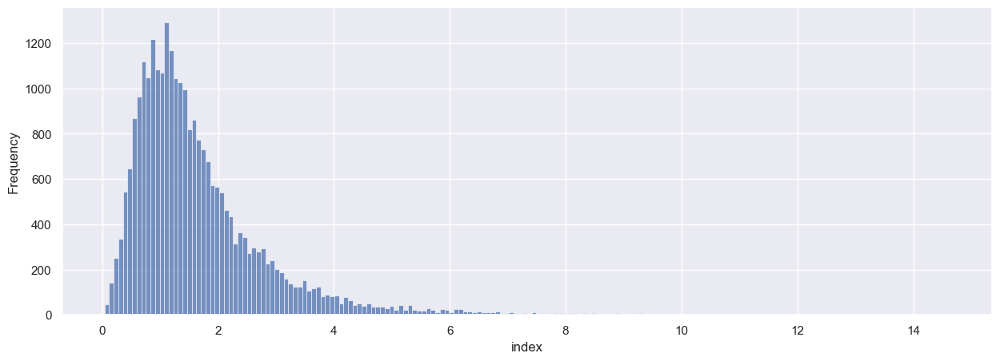

In [39]:
ax = plt.subplots(figsize = (15,5))
sns.histplot(df['index'])
plt.ylabel('Frequency')
plt.show()

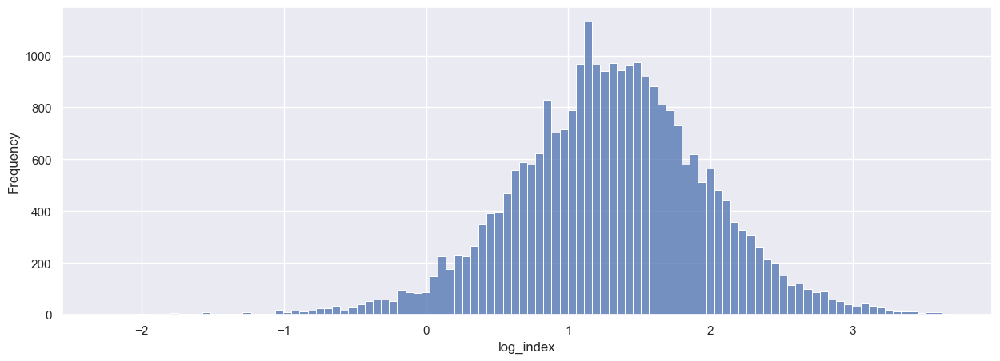

In [40]:
ax = plt.subplots(figsize = (15,5))
sns.histplot(df['log_index'])
plt.ylabel('Frequency')
plt.show()

In [42]:
df[['index','log_index']].describe()

,index,log_index
count,26993.000000,26993.000000
mean,1.694164,1.298962
std,1.303400,0.680876
min,0.038350,-2.260994
25%,0.879682,0.871805
50%,1.354130,1.303159
75%,2.075041,1.729981
max,14.633651,3.683324


### Poverty classification

Based on the 'index' feature above, we will visualize what are the shares of non-poor, poor and indigent people in our population.

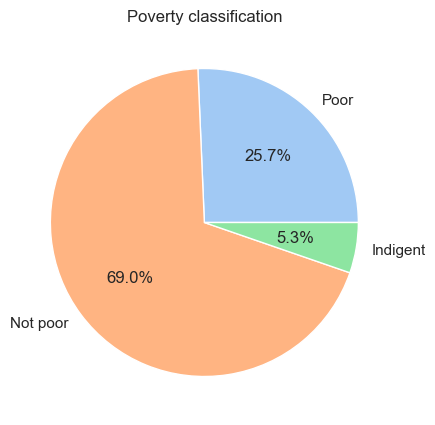

In [41]:
poor = len(df[df.poor_category=='Pobre'])/len(df)
not_poor = len(df[df.poor_category=='No.Pobre'])/len(df)
indigent = len(df[df.poor_category=='Indigente'])/len(df)
y = np.array([poor, not_poor, indigent])
x = ['Poor', 'Not poor', 'Indigent']

colors = sns.color_palette('pastel')[0:3]
plt.figure(figsize = (5,5))
plt.pie(y, labels=x, colors=colors, autopct='%0.1f%%')

plt.title('Poverty classification')
plt.show()

### Age

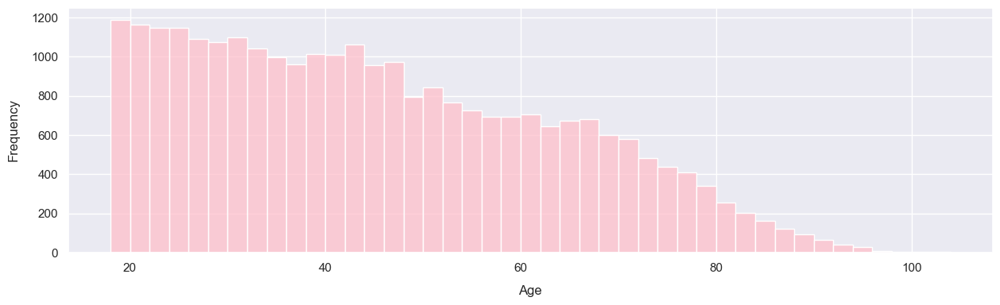

In [47]:
ax = plt.subplots(figsize = (15,4))
sns.histplot(df.age, color='pink')
plt.xlabel('Age', labelpad=10)
plt.ylabel('Frequency', labelpad=10)
plt.show()

In [50]:
df[['age']].describe()

,age
count,26993.000000
mean,44.925870
std,18.304732
min,18.000000
25%,29.000000
50%,43.000000
75%,59.000000
max,104.000000


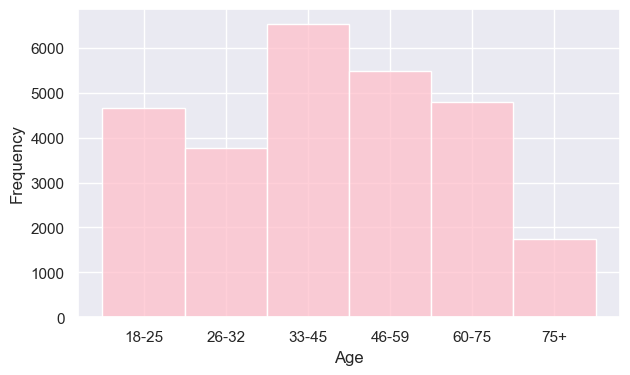

In [42]:
# Create a copy of the dataframe, with just the age feature, and the age range.
ddf = df[['age']]
ddf['age_range'] = ''

# Define a function that assigns every observation to the age range to which it belongs.
def fct_age(df):
    age = df.age
    if 18 <= age <= 25:
        return '18-25'
    elif 26 <= age <= 32:
        return '26-32'
    elif 33 <= age <= 45:
        return '33-45'
    elif 46 <= age <= 59:
        return '46-59'
    elif 60 <= age <= 75:
        return '60-75'
    else:
        return '75+'

# Apply the function on the dataset
ddf['age_range'] = ddf.apply(fct_age, axis=1)

# Order age ranges in the right order
dico = {'18-25':1, '26-32':2, '33-45':3, '46-59':4, '60-75':5, '75+':6}
ddf['order'] = ddf['age_range'].map(dico)
ddf = ddf.sort_values(by=['order'])

# Plot
ax = plt.subplots(figsize = (7,4))
sns.histplot(ddf.age_range, color='pink')
plt.xlabel("Age")
plt.ylabel('Frequency')
plt.show()

### Sex

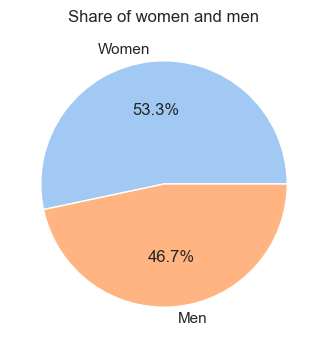

In [63]:
def distribution(df, dfcolumn, label0, label1):
    total=len(df)
    share0=len(df[dfcolumn==0])
    share1=len(df[dfcolumn==1])
    x = [label0,label1]
    y = np.array([share0,share1])
    return [x,y]

def piechart(x,y,title):
    colors = sns.color_palette('pastel')[0:2]
    plt.figure(figsize = (4,4))
    plt.pie(y, labels=x, colors=colors, autopct='%0.1f%%')
    plt.title(title)
    plt.show()

x,y = distribution(df, df.sex, 'Women', 'Men')
piechart(x,y,'Share of women and men')

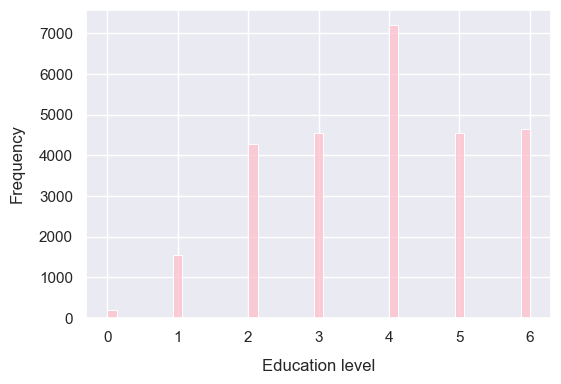

In [44]:
ddf = df[['NIVEL_ED', 'index']]
ddf['NIVEL_ED'] = ddf['NIVEL_ED'].replace({7: 0})

ax = plt.subplots(figsize = (6,4))
sns.histplot(ddf.NIVEL_ED, color='pink')
plt.xlabel("Education level", labelpad=10)
plt.ylabel('Frequency', labelpad=10)
plt.show()

Legend:
* 0 = No instruction
* 1 = Incomplete primary (includes special education)
* 2 = Full primary
* 3 = Incomplete secondary
* 4 = Full secondary
* 5 = Incomplete university degree
* 6 = Complete university higher

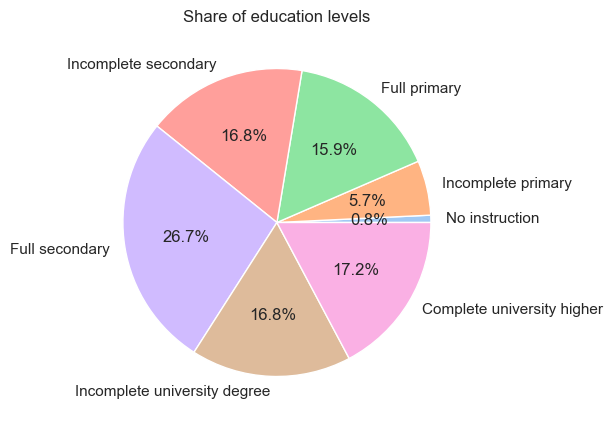

In [45]:
share0 = len(ddf[ddf.NIVEL_ED==0])/len(ddf)
share1 = len(ddf[ddf.NIVEL_ED==1])/len(ddf)
share2 = len(ddf[ddf.NIVEL_ED==2])/len(ddf)
share3 = len(ddf[ddf.NIVEL_ED==3])/len(ddf)
share4 = len(ddf[ddf.NIVEL_ED==4])/len(ddf)
share5 = len(ddf[ddf.NIVEL_ED==5])/len(ddf)
share6 = len(ddf[ddf.NIVEL_ED==6])/len(ddf)
y = np.array([share0,share1,share2,share3,share4,share5,share6])
x = ['No instruction', 'Incomplete primary', 'Full primary', 'Incomplete secondary', 'Full secondary',
    'Incomplete university degree', 'Complete university higher']

colors = sns.color_palette('pastel')[0:10]
plt.figure(figsize = (5,5))
plt.pie(y, labels=x, colors=colors, autopct='%0.1f%%')

plt.title('Share of education levels')
plt.show()

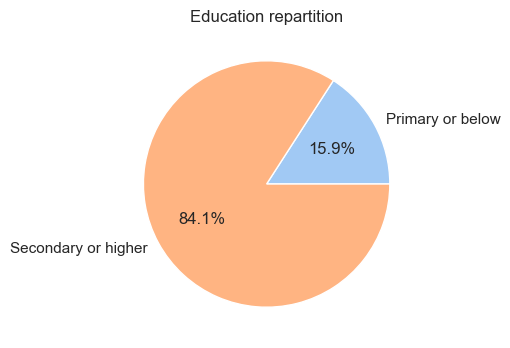

In [79]:
ddf = df[['NIVEL_ED']]
ddf['NIVEL_ED'] = ddf['NIVEL_ED'].replace({7: 0})
ddf['educ_cat'] = ''
ddf = ddf.reset_index(drop=True)

for i in range(len(ddf)):
    if ddf.NIVEL_ED[i] == 0:
        ddf.educ_cat[i] = 0
    if ddf.NIVEL_ED[i] == 1:
        ddf.educ_cat[i] = 0
    if ddf.NIVEL_ED[i] == 2:
        ddf.educ_cat[i] = 0
    else:
        ddf.educ_cat[i] = 1

x,y = distribution(ddf, ddf.educ_cat, 'Primary or below', 'Secondary or higher')
piechart(x,y,'Education repartition')

### Link between education and living conditions

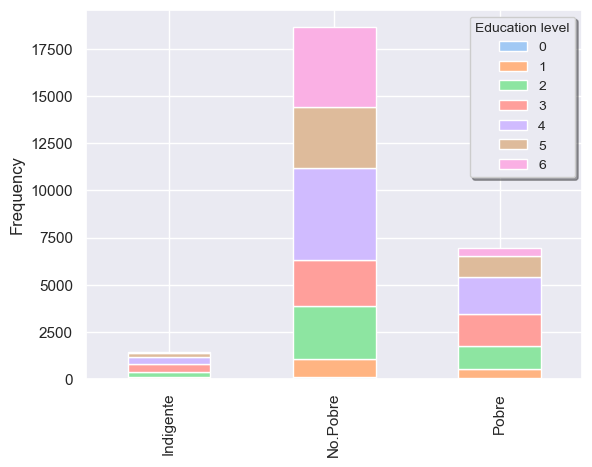

In [46]:
ddf = df[['NIVEL_ED', 'poor_category']]
ddf['NIVEL_ED'] = ddf['NIVEL_ED'].replace({7: 0})
ddf = pd.DataFrame(ddf.groupby(['poor_category', 'NIVEL_ED']).size().reset_index(name='counts'))

ddf = ddf.pivot(index='poor_category', columns='NIVEL_ED', values='counts')
ddf = ddf.rename_axis(None, axis=0)
ddf = ddf.rename_axis(None, axis=1)

colors = sns.color_palette('pastel')[0:7]
ddf.plot(kind='bar', stacked=True, color=colors) 
plt.ylabel('Frequency')
plt.legend(title='Education level', fontsize=10, title_fontsize=10, shadow=True)
plt.show()

### Family size

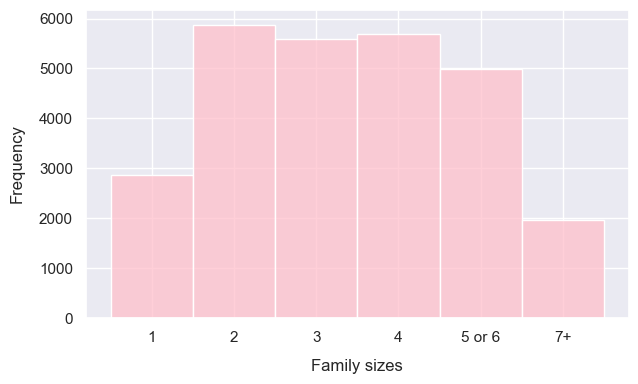

In [47]:
# Group family sizes by ranges
ddf = df[['nb_people_per_house']]
ddf['family_cat'] = ''

def family(df):
    value = df.nb_people_per_house
    if 1 <= value <= 4:
        return str(value)
    if 5 <= value <= 6:
        return '5 or 6'
    else:
        return '7+'

ddf.family_cat = ddf.apply(family,axis=1)

dico = {'1':1, '2':2, '3':3, '4':4, '5 to 8':5, '9+':6}
ddf['order'] = ddf['family_cat'].map(dico)
ddf = ddf.sort_values(by=['order'])

# Plot
ax = plt.subplots(figsize = (7,4))
sns.histplot(ddf.family_cat, color='pink')
plt.xlabel("Family sizes", labelpad=10)
plt.ylabel("Frequency", labelpad=10)
plt.show()

### Sources of income

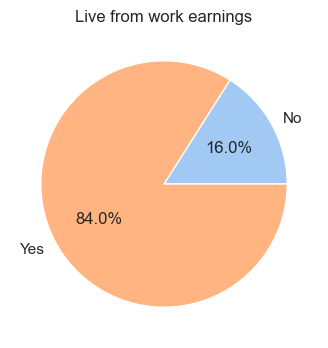

In [48]:
x,y = distribution(df, df.lived_from_work_earnings, 'No', 'Yes')
piechart(x,y,'Live from work earnings')

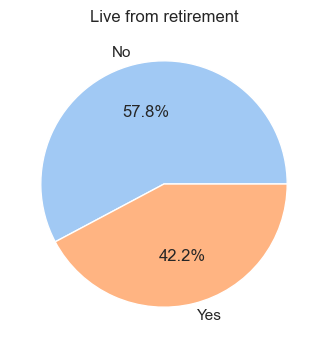

In [49]:
x,y = distribution(df, df.lived_from_retirement, 'No', 'Yes')
piechart(x,y,'Live from retirement')

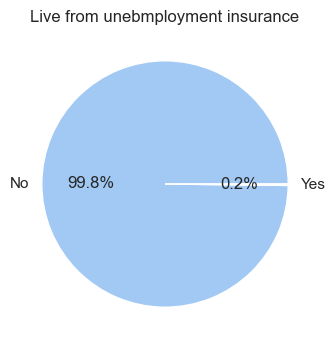

In [50]:
x,y = distribution(df, df.lived_from_unemployment_insurance, 'No', 'Yes')
piechart(x,y,'Live from unebmployment insurance')

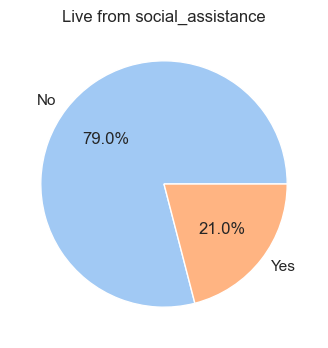

In [51]:
x,y = distribution(df, df.lived_from_social_assistance, 'No', 'Yes')
piechart(x,y,'Live from social_assistance')

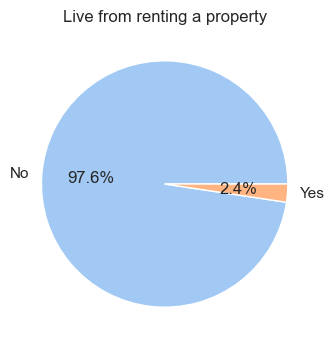

In [52]:
x,y = distribution(df, df.lived_from_rent_own_property, 'No', 'Yes')
piechart(x,y,'Live from renting a property')

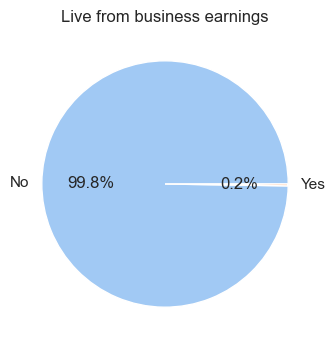

In [53]:
x,y = distribution(df, df.lived_from_business_earnings, 'No', 'Yes')
piechart(x,y,'Live from business earnings')

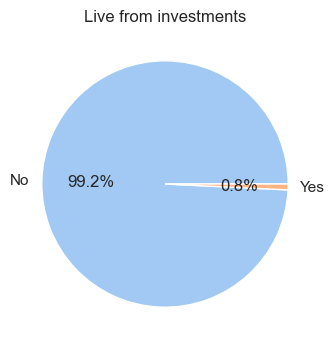

In [54]:
x,y = distribution(df, df.lived_from_investments, 'No', 'Yes')
piechart(x,y,'Live from investments')

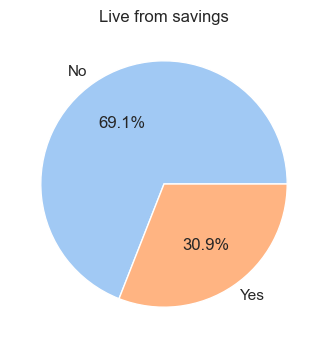

In [55]:
x,y = distribution(df, df.lived_from_savings, 'No', 'Yes')
piechart(x,y,'Live from savings')

### Regions

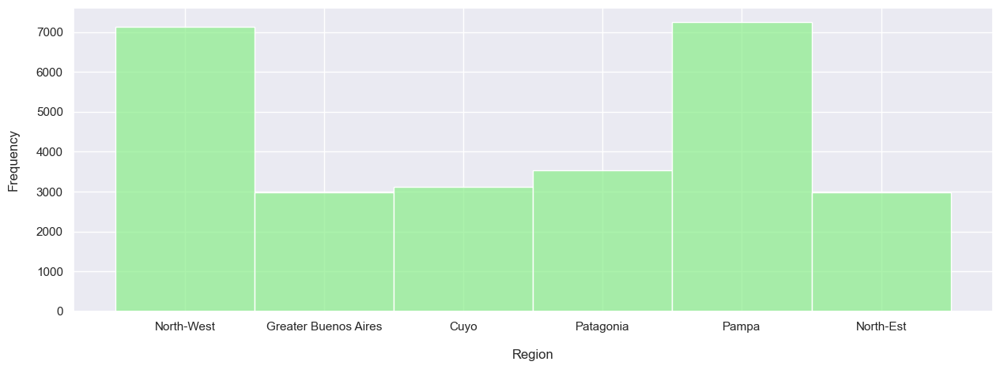

In [56]:
ddf = df[['REGION']]
dico = {1:'Greater Buenos Aires', 40:'North-West', 41:'North-Est', 42:'Cuyo', 43:'Pampa', 44:'Patagonia'}
ddf['region'] = ddf['REGION'].map(dico)

ax = plt.subplots(figsize = (15,5))
sns.histplot(ddf.region, color='lightgreen')
plt.xlabel('Region', labelpad=15)
plt.ylabel('Frequency', labelpad=15)
plt.show()

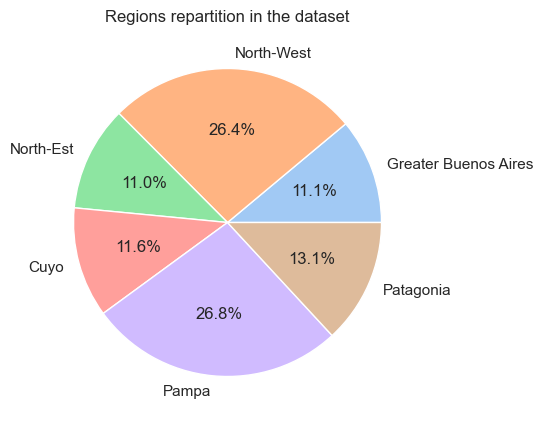

In [57]:
share1 = len(ddf[ddf.region=='Greater Buenos Aires'])/len(ddf)
share2 = len(ddf[ddf.region=='North-West'])/len(ddf)
share3 = len(ddf[ddf.region=='North-Est'])/len(ddf)
share4 = len(ddf[ddf.region=='Cuyo'])/len(ddf)
share5 = len(ddf[ddf.region=='Pampa'])/len(ddf)
share6 = len(ddf[ddf.region=='Patagonia'])/len(ddf)

y = np.array([share1,share2,share3,share4,share5,share6])
x = ['Greater Buenos Aires', 'North-West', 'North-Est', 'Cuyo', 'Pampa', 'Patagonia']

colors = sns.color_palette('pastel')[0:10]
plt.figure(figsize = (5,5))
plt.pie(y, labels=x, colors=colors, autopct='%0.1f%%')

plt.title("Regions repartition in the dataset")
plt.show()

**Poverty rate in every region**

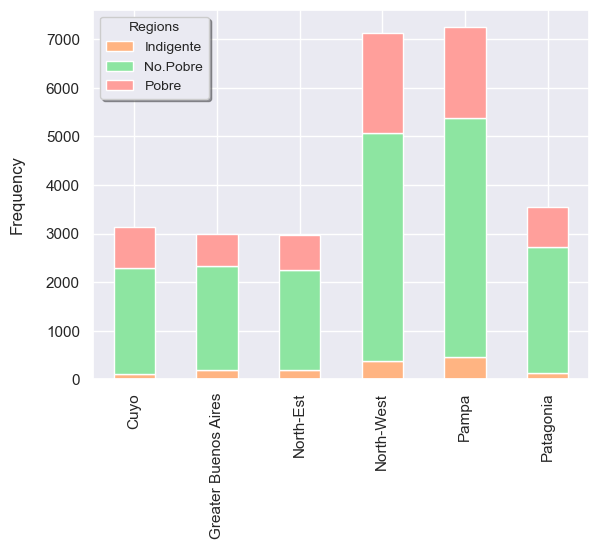

In [58]:
ddf = df[['REGION', 'poor_category']]
ddf['REGION'] = ddf['REGION'].replace({1:'Greater Buenos Aires', 40:'North-West', 41:'North-Est', 42:'Cuyo', 
                                       43:'Pampa', 44:'Patagonia'})
ddf = pd.DataFrame(ddf.groupby(['poor_category', 'REGION']).size().reset_index(name='counts'))

ddf = ddf.pivot(index='REGION', columns='poor_category', values='counts')
ddf = ddf.rename_axis(None, axis=0)
ddf = ddf.rename_axis(None, axis=1)

colors = sns.color_palette('pastel')[1:]
ddf.plot(kind='bar', stacked=True, color=colors) 
plt.ylabel('Frequency', labelpad=15)
plt.legend(title='Regions', fontsize=10, title_fontsize=10, shadow=True)
plt.show()

### Correlation heatmaps

**Quantitative variables**

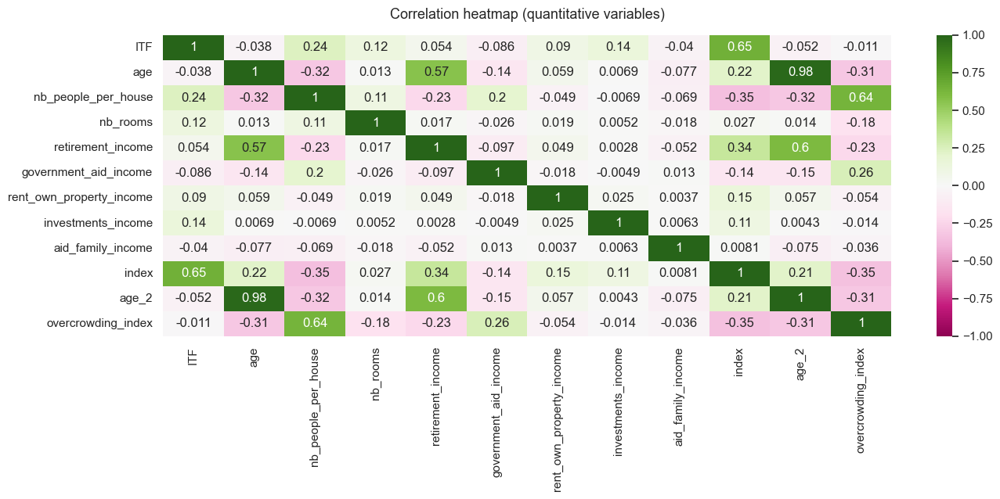

In [59]:
ax = plt.subplots(figsize = (15,5))
sns.heatmap(df_quanti.corr(), vmin=-1, vmax=1, annot=True, cmap="PiYG")
plt.title('Correlation heatmap (quantitative variables)', fontsize=13, pad=15)
plt.show()

**Binary variables**

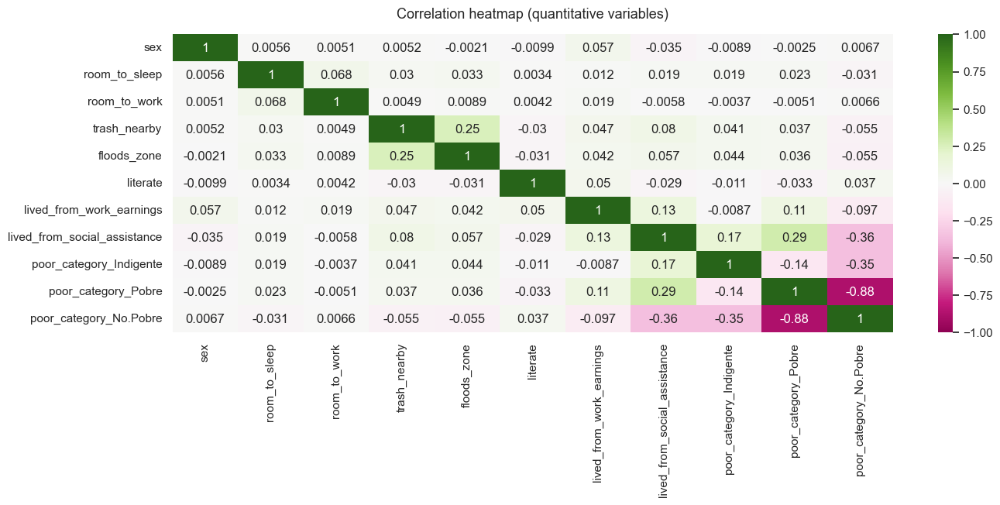

In [60]:
# Let's select some binary variables

ddf = df1[['sex', 'room_to_sleep', 'room_to_work', 'trash_nearby', 'floods_zone', 'literate', 
          'lived_from_work_earnings', 'lived_from_social_assistance', 'poor_category_Indigente', 
          'poor_category_Pobre', 'poor_category_No.Pobre']]

ax = plt.subplots(figsize = (15,5))
sns.heatmap(ddf.corr(), vmin=-1, vmax=1, annot=True, cmap="PiYG")
plt.title('Correlation heatmap (quantitative variables)', fontsize=13, pad=15)
plt.show()

# 3. Dimensionality reduction

### Correlation

1. Check correlation and sort it from higher to lowest

In [61]:
df_cleaned = pd.read_csv(path+'Database_cleaned.csv', low_memory=False)
df_cleaned

,age,sex,kitchen,laundry,garage,room_to_sleep,room_to_work,trash_nearby,floods_zone,shantytown,...,property_ownership_regime_3,property_ownership_regime_4,property_ownership_regime_5,property_ownership_regime_6,property_ownership_regime_7,property_ownership_regime_8,property_ownership_regime_9,poor_category_Indigente,poor_category_No.Pobre,poor_category_Pobre
0,55,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,20,1,0,1,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
2,52,1,0,1,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
3,43,0,0,1,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
4,38,0,1,1,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26988,48,0,1,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
26989,23,0,1,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
26990,21,0,1,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
26991,49,1,1,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0


In [62]:
df_cleaned = df_cleaned.drop(['index', 'poor_category_Indigente', 'poor_category_No.Pobre', 
                             'poor_category_Pobre'], axis=1)

In [63]:
corr_matrix = df_cleaned.corr()

# sort the correlation matrix by the absolute value of the correlation coefficient in descending order
sorted_corr_matrix = corr_matrix.abs().unstack().sort_values(kind="quicksort", ascending=False)

# drop the diagonal entries (correlation of a variable with itself)
sorted_corr_matrix = sorted_corr_matrix[sorted_corr_matrix.index.get_level_values(0) != sorted_corr_matrix.index.get_level_values(1)]

# get the sorted_corr_matrix with only two digits after the comma
sorted_corr_matrix = sorted_corr_matrix.round(2)

# print the sorted correlation matrix
print(sorted_corr_matrix)

housing_type_1               housing_type_2                 0.99
housing_type_2               housing_type_1                 0.99
age_2                        age                            0.98
age                          age_2                          0.98
Fuel_for_cooking_2           Fuel_for_cooking_1             0.98
                                                            ... 
floods_zone                  roof_type_2                    0.00
property_ownership_regime_8  sewerage_2                     0.00
sewerage_2                   property_ownership_regime_8    0.00
ESTADO_2                     lived_from_work_earnings       0.00
lived_from_work_earnings     ESTADO_2                       0.00
Length: 25440, dtype: float64


2. Check percentage of variables with a correlation higher than 80%

In [64]:
# get the number of variables
num_vars = df_cleaned.shape[1]

# extract the values of the upper triangle of the correlation matrix
high_corr_vars = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)).stack().reset_index()

# rename columns
high_corr_vars.columns = ['var1','var2','correlation']

# take the absolute values
high_corr_vars['correlation'] = high_corr_vars['correlation'].apply(lambda x: abs(x))

# filter the values that are higher than the threshold
high_corr_vars = high_corr_vars[high_corr_vars['correlation'] > 0.8]

# calculate the percentage of variables with a correlation higher than 80%
percentage = len(high_corr_vars) / num_vars * 100

#print the percentage
print("Percentage of variables with a correlation higher than 80%:", percentage)

Percentage of variables with a correlation higher than 80%: 6.25


### Lasso and Elastic-net

1. Select best hyperparameters for Lasso and Elastic-net using GridSearchCV

In [65]:
# Define the X and y variables
X = df_cleaned.drop(['log_index'], axis=1)
y = df_cleaned['log_index']

# Scale the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Define range for l1_ratio 
l1_ratio_range = np.linspace(0, 1, num=11, endpoint=False)[1:]

# Define the parameter grid for Lasso and Elastic-net
param_grid_lasso = {'alpha': np.logspace(-3, -0.5, 30)}
param_grid_elastic_net = {'alpha': np.logspace(-3, 3, 7), 'l1_ratio': l1_ratio_range, 'max_iter': [5000]}

# Define the Lasso and ElasticNet models
lasso = Lasso()
elastic_net = ElasticNet()

# Create the GridSearchCV objects
grid_lasso = GridSearchCV(lasso, param_grid_lasso, cv=5)
grid_elastic_net = GridSearchCV(elastic_net, param_grid_elastic_net, cv=5)

# Fit the GridSearchCV objects to the data
grid_lasso.fit(X_scaled, y)
grid_elastic_net.fit(X_scaled, y)

# Print the best hyperparameters
print("Lasso best hyperparameters: ", grid_lasso.best_params_)
print("Elastic-net best hyperparameters: ", grid_elastic_net.best_params_)

Lasso best hyperparameters:  {'alpha': 0.001}
Elastic-net best hyperparameters:  {'alpha': 0.001, 'l1_ratio': 0.5454545454545454, 'max_iter': 5000}


2. Check the percentage of coefficients that were shrinked to zero

In [66]:
# Get the coefficients of the Lasso, Adaptive Lasso and Elastic-net models
lasso_coef = grid_lasso.best_estimator_.coef_
elastic_net_coef = grid_elastic_net.best_estimator_.coef_

# Count the number of zero coefficients
lasso_zero_coef = np.count_nonzero(lasso_coef == 0)
elastic_net_zero_coef = np.count_nonzero(elastic_net_coef == 0)

# Calculate the percentage of variables that were dropped to zero
lasso_percentage = lasso_zero_coef / X_scaled.shape[1] * 100
elastic_net_percentage = elastic_net_zero_coef / X_scaled.shape[1] * 100

# Print the percentage
print("Percentage of variables dropped to zero with Lasso: ", lasso_percentage)
print("Percentage of variables dropped to zero with Elastic-net: ", elastic_net_percentage)

Percentage of variables dropped to zero with Lasso:  16.9811320754717
Percentage of variables dropped to zero with Elastic-net:  12.578616352201259


3. We compare both models, Lasso and Elastic-Net. The methods selected to perform the comparison are: 

- Cross-validation: The model with the highest average cross-validation score is the best model. We get the mean of the accuracy score
- R-squared: The higher the R-squared, the better the model is.

In [67]:
# Get the best alpha for Lasso
best_alpha_lasso = grid_lasso.best_params_['alpha']

# Get the best alpha and l1_ratio for Elastic-net
best_alpha_elastic_net = grid_elastic_net.best_params_['alpha']
best_l1_ratio_elastic_net = grid_elastic_net.best_params_['l1_ratio']

# Fit the Lasso model
lasso = Lasso(alpha=best_alpha_lasso)
lasso.fit(X_scaled, y)

# Fit the Elastic-net model
elastic_net = ElasticNet(alpha=best_alpha_elastic_net, l1_ratio=best_l1_ratio_elastic_net)
elastic_net.fit(X_scaled, y)

# Cross-validation
lasso_cv = cross_val_score(lasso, X_scaled, y, cv=5)
elastic_net_cv = cross_val_score(elastic_net, X_scaled, y, cv=5)

# R-squared
lasso_r2 = r2_score(y, lasso.predict(X_scaled))
elastic_net_r2 = r2_score(y, elastic_net.predict(X_scaled))

# Print the results
print("Mean Lasso cross-validation score: ", round(lasso_cv.mean(),5))
print("Mean Elastic-net cross-validation score: ", round(elastic_net_cv.mean(),5))
print('\n')
print("Lasso R-squared: ", round(lasso_r2,5))
print("Elastic-net R-squared: ", round(elastic_net_r2,5))

Mean Lasso cross-validation score:  0.50597
Mean Elastic-net cross-validation score:  0.5061


Lasso R-squared:  0.51762
Elastic-net R-squared:  0.5181


We will proceed in the following sections with the results obtained from the Elastic-net approach.

In [68]:
# Get the coefficients of the Elastic-net model
coefs = elastic_net.coef_

# Create a boolean mask to filter out the variables with zero coefficients
mask = coefs != 0

# Use the mask to filter the original X dataframe
X_dim_red = X.loc[:, mask]

4. The Elastic-net model shrinked 20 variables to zero, and we originally had 159 variables. Therefore, the database with the dimensionality reduction applied contains 139 variables

In [69]:
# Check number of variables that were shrinked to zero by the Elastic-net model
elastic_net_zero_coef

20

In [70]:
X_dim_red

,age,sex,kitchen,laundry,garage,room_to_sleep,room_to_work,trash_nearby,floods_zone,shantytown,...,social_security_type_123,property_ownership_regime_1,property_ownership_regime_2,property_ownership_regime_3,property_ownership_regime_4,property_ownership_regime_5,property_ownership_regime_6,property_ownership_regime_7,property_ownership_regime_8,property_ownership_regime_9
0,55,0,1,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
1,20,1,0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2,52,1,0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,43,0,0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,38,0,1,1,1,0,1,0,0,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26988,48,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
26989,23,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
26990,21,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
26991,49,1,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [71]:
# Save as csv
X_dim_red.to_csv(path+'Database_dim_red.csv', index=False)

In [72]:
X_dim_red = pd.read_csv(path+'Database_dim_red.csv', low_memory=False)
X_dim_red

,age,sex,kitchen,laundry,garage,room_to_sleep,room_to_work,trash_nearby,floods_zone,shantytown,...,social_security_type_123,property_ownership_regime_1,property_ownership_regime_2,property_ownership_regime_3,property_ownership_regime_4,property_ownership_regime_5,property_ownership_regime_6,property_ownership_regime_7,property_ownership_regime_8,property_ownership_regime_9
0,55,0,1,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
1,20,1,0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2,52,1,0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,43,0,0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,38,0,1,1,1,0,1,0,0,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26988,48,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
26989,23,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
26990,21,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
26991,49,1,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


# 4. Random Forest 

### 4.1. Data preparation

In [23]:
df_cleaned = pd.read_csv(path+'Database_cleaned.csv', low_memory=False)
df_cleaned

,age,sex,kitchen,laundry,garage,room_to_sleep,room_to_work,trash_nearby,floods_zone,shantytown,...,property_ownership_regime_3,property_ownership_regime_4,property_ownership_regime_5,property_ownership_regime_6,property_ownership_regime_7,property_ownership_regime_8,property_ownership_regime_9,poor_category_Indigente,poor_category_No.Pobre,poor_category_Pobre
0,55,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,20,1,0,1,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
2,52,1,0,1,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
3,43,0,0,1,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
4,38,0,1,1,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26988,48,0,1,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
26989,23,0,1,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
26990,21,0,1,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
26991,49,1,1,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0


In [24]:
df = pd.read_csv(path+'Database_dim_red.csv', low_memory=False)
df

,age,sex,kitchen,laundry,garage,room_to_sleep,room_to_work,trash_nearby,floods_zone,shantytown,...,social_security_type_123,property_ownership_regime_1,property_ownership_regime_2,property_ownership_regime_3,property_ownership_regime_4,property_ownership_regime_5,property_ownership_regime_6,property_ownership_regime_7,property_ownership_regime_8,property_ownership_regime_9
0,55,0,1,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
1,20,1,0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2,52,1,0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,43,0,0,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,38,0,1,1,1,0,1,0,0,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26988,48,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
26989,23,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
26990,21,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
26991,49,1,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


Keep only the variables of our interest

In [25]:
# Create the variable log of the index to correct the skewness to the right
df_cleaned['log_index'] = np.log(df_cleaned['index'])+1

# Check that the number of individuals above 1 (non-poor) is the same
print((df_cleaned['log_index'] > 1).sum())
print((df_cleaned['index'] > 1).sum())

18635
18635


In [26]:
y = df_cleaned['log_index']
y

0        2.204414
1        0.881810
2        0.881810
3        0.881810
4        1.185284
           ...   
26988    0.210465
26989    0.210465
26990    0.210465
26991    0.210465
26992    1.789281
Name: log_index, Length: 26993, dtype: float64

### 4.2. Scaling the data

In [27]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df)

### 4.3. Test, validation and train samples

In [28]:
# Split [train/valid]/test
X_train, X_rem, Y_train, Y_rem = train_test_split(X_scaled, y, test_size=0.2, random_state=1)

# Split train/validation
X_validation, X_test, Y_validation, Y_test = train_test_split(X_rem, Y_rem, test_size=0.5, random_state=1)

print('X train sample size:', X_train.shape)
print('y train sample size:', Y_train.shape)
print('\n')
print('X validation sample size:', X_validation.shape)
print('y validation sample size:', Y_validation.shape)
print('\n')
print('X test sample size:', X_test.shape)
print('y test sample size:', Y_test.shape)

X train sample size: (21594, 139)
y train sample size: (21594,)


X validation sample size: (2699, 139)
y validation sample size: (2699,)


X test sample size: (2700, 139)
y test sample size: (2700,)


### 4.4. First model without tuning hyperparameters

In [79]:
# Define the model
regressor0 = RandomForestRegressor(random_state=0)

# Fit the model on the training data
regressor0.fit(X_train, Y_train)

RandomForestRegressor(random_state=0)

In [80]:
# Build a prediction with this first model, on the training set
Y_train_pred0 = regressor0.predict(X_train)
Y_test_pred0 = regressor0.predict(X_test)

# Print the prediction
print(Y_train_pred0)

[0.44645297 1.52961425 0.85734694 ... 0.27965213 0.66219226 0.39297428]


In [81]:
# Compute the mean squared error of the prediction of the training set
MSE_train0 = mean_squared_error(Y_train, Y_train_pred0)

# Build a prediction on the validation set, and compute the MSE
Y_validation_pred0 = regressor0.predict(X_validation)
MSE_validation0 = mean_squared_error(Y_validation, Y_validation_pred0)

# Comparing the two MSEs
print("MSE for train sample:", round(MSE_train0,3))
print("MSE for validation sample:", round(MSE_validation0,3))
print('\n')
print('The MSE is', round(MSE_validation0/MSE_train0,1),
      'times higher on the validation than on the training set.')

MSE for train sample: 0.027
MSE for validation sample: 0.172


The MSE is 6.4 times higher on the validation than on the training set.


The MSE is higher for the validation sample, this shows that the model is not using good hyperparameters.

### 4.5. Tuning the hyperparameters

First we are using the **RandomizedSearchCV**. This method allows to find the best hyperparameters. Parameters of the estimator used to apply these methods are optimized by cross-validated search over parameter settings.

In [82]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]

# Number of features to consider at every split
max_features = ['auto', 'sqrt']

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [15, 25, 45]

# Minimum number of samples required at each leaf node
min_samples_leaf = [10, 20, 40]

# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [15, 25, 45], 'min_samples_leaf': [10, 20, 40], 'bootstrap': [True, False]}


In [83]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor(random_state = 0)

# Random search of parameters, using 3 fold cross validation, 
rf_random = RandomizedSearchCV(estimator=rf, param_distributions=random_grid,
                              n_iter = 10, scoring='neg_mean_absolute_error', 
                              cv = 3, verbose=2, random_state=0, n_jobs=-1,
                              return_train_score=True)

# Fit the random search model
rf_random.fit(X_train, Y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(random_state=0),
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [10, 20, 40],
                                        'min_samples_split': [15, 25, 45],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=0, return_train_score=True,
                   scoring='neg_mean_absolute_error', verbose=2)

In [84]:
rf_random.best_params_

{'n_estimators': 800,
 'min_samples_split': 15,
 'min_samples_leaf': 20,
 'max_features': 'auto',
 'max_depth': 100,
 'bootstrap': True}

More iterations will cover a wider search space and more CV folds reduces the chances of overfitting, but raising each will increase the run time. Machine learning is a field of trade-offs, and performance vs time is one of the most fundamental.

Now we will test a range of hyperparameters around the best values returned by random search using **GridSearchCV**.

In [85]:
param_grid = {'n_estimators': [700,800],
              'max_features': [100,139],
              'min_samples_split': [10,15],
              'min_samples_leaf': [15,20],
              'max_depth': [100]
             }

regressor1 = RandomForestRegressor( random_state=0)

grid_search = GridSearchCV(regressor1,
                          param_grid,
                          scoring = "neg_mean_squared_error",
                          return_train_score=True,
                          cv = 3, n_jobs =-1) 

grid_search.fit(X_train, Y_train)
grid_search.best_params_

{'max_depth': 100,
 'max_features': 100,
 'min_samples_leaf': 15,
 'min_samples_split': 10,
 'n_estimators': 700}

Another Grid Search to see if the result of the last one are stable:

In [86]:
param_grid = {'n_estimators': [700,600],
              'max_features': [100,90],
              'min_samples_split': [10,5],
              'min_samples_leaf': [15,10],
              'max_depth': [100,110]
             }

regressor2 = RandomForestRegressor( random_state=0)

grid_search = GridSearchCV(regressor2,
                          param_grid,
                          scoring = 'neg_mean_squared_error',
                          return_train_score=True,
                          cv = 3, n_jobs =-1) 

grid_search.fit(X_train, Y_train)
grid_search.best_params_

{'max_depth': 100,
 'max_features': 90,
 'min_samples_leaf': 10,
 'min_samples_split': 10,
 'n_estimators': 600}

We obtain the same results for 'min_samples_split', 'max_depth'. We will plot how the MSE when changing some of the hyperparameters.

In [87]:
MSETrainingR = []
MSEValidationR = []
Estimators1 = []

for estimators in range(10, 110, 10):
    regressor3 = RandomForestRegressor(n_estimators=700, max_features=100, max_depth=100,
                                       min_samples_leaf=estimators,min_samples_split= 10, random_state=0)
    regressor3.fit(X_train, Y_train)
    
    Y_training_pred3 = regressor3.predict(X_train)
    MSE_train3 = mean_squared_error(Y_train, Y_training_pred3)
   
    Y_validation_pred3 = regressor3.predict(X_validation)

    MSE_validation3 = mean_squared_error(Y_validation, Y_validation_pred3)
    print("Minimum size of terminal nodes", estimators,
          " -MSE train sample:", MSE_train3,
          " -MSE validation sample:", MSE_validation3)
    MSETrainingR.append(MSE_train3)
    MSEValidationR.append(MSE_validation3)
    Estimators1.append(estimators)

Minimum size of terminal nodes 10  -MSE train sample: 0.15246911521619755  -MSE validation sample: 0.19049198725556563
Minimum size of terminal nodes 20  -MSE train sample: 0.18670899084337986  -MSE validation sample: 0.1985197451644553
Minimum size of terminal nodes 30  -MSE train sample: 0.20177211134429934  -MSE validation sample: 0.20395639367910132
Minimum size of terminal nodes 40  -MSE train sample: 0.21108410124128663  -MSE validation sample: 0.2078168436900591
Minimum size of terminal nodes 50  -MSE train sample: 0.21758531613217164  -MSE validation sample: 0.21129592093951693
Minimum size of terminal nodes 60  -MSE train sample: 0.22250206165635159  -MSE validation sample: 0.2137928028064807
[CV] END bootstrap=False, max_depth=30, max_features=auto, min_samples_leaf=40, min_samples_split=45, n_estimators=1600; total time= 2.9min
[CV] END bootstrap=False, max_depth=80, max_features=auto, min_samples_leaf=20, min_samples_split=25, n_estimators=1800; total time= 3.6min
[CV] END 

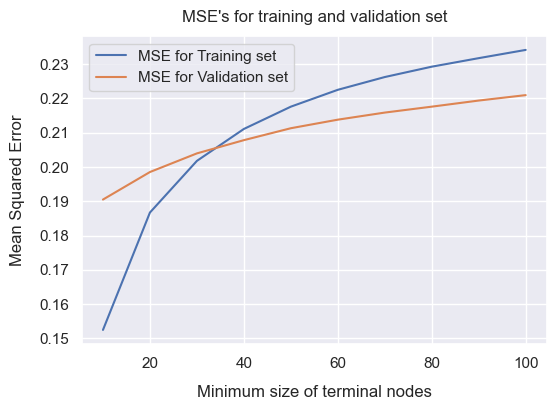

In [88]:
ax = plt.subplots(figsize = (6,4))
plt.plot(Estimators1, MSETrainingR, label = "MSE for Training set")
plt.plot(Estimators1, MSEValidationR, label = "MSE for Validation set")
plt.xlabel('Minimum size of terminal nodes', labelpad=10)
plt.ylabel('Mean Squared Error', labelpad=10)
plt.title("MSE's for training and validation set", pad=10)
plt.legend()
plt.show()

The MSE in both samples (training and validation sets) are increasing with the minimum size of terminal node. However, the growth of the MSE is much faster in the training sample. The MSE being smaller for smaller minimum size of terminal nodes implies that the model is penalizing models that are more general or that lose details by not allowing a bigger minimum number of samples be at a leaf node. Smaller node size allows more detailed trees that can be better for prediction, despite that they can be more complex and can generate overfitting. We are chosing a minimum size of terminal nodes of 30 as in that point both MSE cross so there is no trade off.

In [89]:
MSETrainingR = []
MSEValidationR = []
Estimators2 = []

for estimators in range(50, 130, 10):
    regressor4 = RandomForestRegressor(n_estimators=700, max_features=estimators, max_depth=100,
                                       min_samples_leaf=30,min_samples_split= 10, random_state=0)
    regressor4.fit(X_train, Y_train)
    
    Y_training_pred4 = regressor4.predict(X_train)
    MSE_train4 = mean_squared_error(Y_train, Y_training_pred4)
   
    Y_validation_pred4 = regressor4.predict(X_validation)

    MSE_validation4 = mean_squared_error(Y_validation, Y_validation_pred4)
    print("Number of features to consider at every split", estimators,
          " -MSE train sample:", MSE_train4,
          " -MSE validation sample:", MSE_validation4)
    MSETrainingR.append(MSE_train4)
    MSEValidationR.append(MSE_validation4)
    Estimators2.append(estimators)

Number of features to consider at every split 50  -MSE train sample: 0.2060418709948871  -MSE validation sample: 0.20426995344479393
Number of features to consider at every split 60  -MSE train sample: 0.20468138860537413  -MSE validation sample: 0.20424588094472873
Number of features to consider at every split 70  -MSE train sample: 0.2035547390900812  -MSE validation sample: 0.20356621899990182
Number of features to consider at every split 80  -MSE train sample: 0.20266539362135902  -MSE validation sample: 0.20364372776760636
Number of features to consider at every split 90  -MSE train sample: 0.20218902816172576  -MSE validation sample: 0.20374355939798852
Number of features to consider at every split 100  -MSE train sample: 0.20177211134429934  -MSE validation sample: 0.20395639367910132
Number of features to consider at every split 110  -MSE train sample: 0.20141084778713308  -MSE validation sample: 0.20389072021815718
Number of features to consider at every split 120  -MSE train 

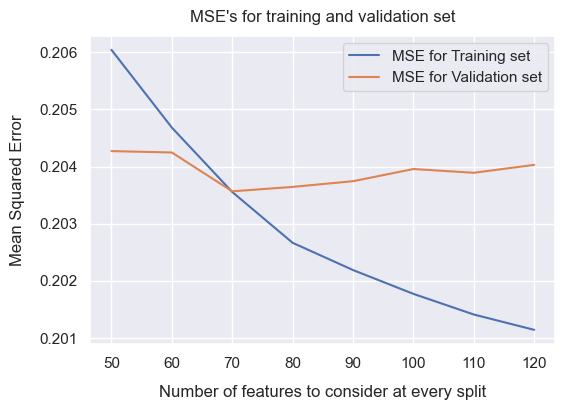

In [90]:
ax = plt.subplots(figsize = (6,4))
plt.plot(Estimators2, MSETrainingR, label = "MSE for Training set")
plt.plot(Estimators2, MSEValidationR, label = "MSE for Validation set")
plt.xlabel('Number of features to consider at every split',labelpad=10)
plt.ylabel('Mean Squared Error',labelpad=10)
plt.title("MSE's for training and validation set",pad=10)
plt.legend()
plt.show()

The MSE for both (training and validation samples) is very low. The MSE for the train sample is decreasing with higher number of features to consider at every split, while the MSE for the validation sample is quite constant. We are chosing a value of 70 for the number of features to consider at every split as it is the where both MSE join.

### 4.6. Final Random Forest model

In [29]:
regressor_final = RandomForestRegressor(n_estimators=700, max_features=70, max_depth=100,
                                       min_samples_leaf=30,min_samples_split= 10, random_state=0)
regressor_final.fit(X_train, Y_train)

RandomForestRegressor(max_depth=100, max_features=70, min_samples_leaf=30,
                      min_samples_split=10, n_estimators=700, random_state=0)

In [30]:
Y_train_pred_final = regressor_final.predict(X_train)
Y_test_pred_final = regressor_final.predict(X_test)
print(Y_test_pred_final)

[1.27971029 2.10030374 1.82731726 ... 1.44921719 1.12337612 1.27539268]


In [91]:
MSE_train_final = mean_squared_error(Y_train, Y_train_pred_final)
Y_validation_pred_final = regressor_final.predict(X_validation)
MSE_validation_final = mean_squared_error(Y_validation, Y_validation_pred_final)

print("MSE for train sample:", round(MSE_train_final,7))
print("MSE for validation sample:", round(MSE_validation_final,7))

MSE for train sample: 0.2035547
MSE for validation sample: 0.2035662


In [92]:
MSE_test_final = mean_squared_error(Y_test, Y_test_pred_final)

print("MSE for test sample:", round(MSE_test_final,4))

MSE for test sample: 0.2273


In [93]:
# Computation of the R-squared
R2_test_final = r2_score(Y_test, Y_test_pred_final)

print("R-squared for test sample:", round(R2_test_final,3))

R-squared for test sample: 0.527


### 4.7. Results visualization

#### Confusion matrix

In [37]:
# Create a dataframe with the true value of y, and the value predicted by the RF model.
a = Y_test.to_frame()
ierf = pd.DataFrame({'y_true':a.log_index,
                     'y_pred':Y_test_pred_final})
ierf = ierf.reset_index(drop=True)

true_non_poor = 0
false_non_poor = 0
true_poor = 0
false_poor = 0

for i in range(len(ierf)):
    if ierf.y_true[i] > 1 and ierf.y_pred[i] > 1:
        true_non_poor += 1
    if ierf.y_true[i] > 1 and ierf.y_pred[i] < 1:
        false_poor += 1
    if ierf.y_true[i] < 1 and ierf.y_pred[i] > 1:
        false_non_poor += 1
    if ierf.y_true[i] < 1 and ierf.y_pred[i] < 1:
        true_poor += 1

print('True non-poor:', true_non_poor)
print('False non-poor:', false_non_poor)
print('True poor:', true_poor)
print('False poor:', false_poor)
print('\n')
print('Inclusion error:', round(false_poor/(true_poor+false_poor)*100,2), '%')
print('Exclusion error:', round(false_non_poor/(true_poor+false_non_poor)*100,2), '%')

True non-poor: 1611
False non-poor: 344
True poor: 526
False poor: 219


Inclusion error: 29.4 %
Exclusion error: 39.54 %


#### Prediction distribution

In [94]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=Y_test, name='Real Index (test sample)'))
fig.add_trace(go.Histogram(x=Y_test_pred_final, name='Predicted Index (test sample)'))

# Overlay both histograms
fig.update_layout(barmode='overlay')

# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75, xbins=dict(size=0.1))
fig.show()

#### Exclusion and inclusion errors

In [17]:
fig = px.scatter(x=Y_train, y=Y_train_pred_final,
                 labels={
                     "x": "Real index for train sample",
                     "y": "Predicted index in train sample"
                 },
                title="Missclasification in Train Sample")
fig.update_layout(
    shapes=[
        dict(
            type= 'line',
            yref= 'y', y0=-1, y1= 4,
            xref= 'x', x0=-1, x1= 4
        )
    ])
fig.add_hline(y=1,line_dash="dash", line_color="green")
fig.add_vline(x=1,line_dash="dash", line_color="green")
fig.show()

In [18]:
fig = px.scatter(x=Y_validation, y=Y_validation_pred_final,
                labels={
                     "x": "Real index for validation sample",
                     "y": "Predicted index in validation sample"
                 },
                title="Missclasification in Validation Sample")
fig.update_layout()
fig.update_layout(
    shapes=[
        dict(
            type= 'line',
            yref= 'y', y0=-1, y1= 4,
            xref= 'x', x0=-1, x1= 4
        )
    ])
fig.add_hline(y=1,line_dash="dash", line_color="green")
fig.add_vline(x=1,line_dash="dash", line_color="green")
fig.show()

In [19]:
fig = px.scatter(x=Y_test, y=Y_test_pred_final,
                labels={
                     "x": "Real index for test sample",
                     "y": "Predicted index in test sample"
                 },
                title="Missclasification in Test Sample")
fig.update_layout()

fig.update_layout(
    shapes=[
        dict(
            type= 'line',
            yref= 'y', y0=-1, y1= 4,
            xref= 'x', x0=-1, x1= 4
        )
    ])
fig.add_hline(y=1,line_dash="dash", line_color="green")
fig.add_vline(x=1,line_dash="dash", line_color="green")
fig.show()

# 5. Support Vector Machine

After using a random forest for this regression, we will now implement a SVM.

### 5.1. Target variable and features

In [6]:
# Define the target variable
y = df_cleaned['log_index']

# Define X
X = df[:]

# Scale X (by removing the mean and scaling to unit variance).
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [7]:
# Split [train/valid]/test
X_train, X_rem, y_train, y_rem = train_test_split(X_scaled, y, test_size=0.2, random_state=1)

# Split train/validation
X_valid, X_test, y_valid, y_test = train_test_split(X_rem, y_rem, test_size=0.5, random_state=1)

print('X train sample size:', X_train.shape)
print('y train sample size:', y_train.shape)
print('\n')
print('X validation sample size:', X_valid.shape)
print('y validation sample size:', y_valid.shape)
print('\n')
print('X test sample size:', X_test.shape)
print('y test sample size:', y_test.shape)

X train sample size: (21594, 139)
y train sample size: (21594,)


X validation sample size: (2699, 139)
y validation sample size: (2699,)


X test sample size: (2700, 139)
y test sample size: (2700,)


### 5.2. First model without tuning the hyperparameters

In [99]:
# Define our SVM model, with a radial basis function (Gaussian) kernel.
model = SVR(kernel = 'rbf')

# Fit the model with training sets
model.fit(X_train, y_train)

# Prediction of y on the training and validation sets:
y_pred_train = model.predict(X_train)
y_pred_valid = model.predict(X_valid)

# Compare MSE of these predictions
MSE_train = mean_squared_error(y_train,y_pred_train)
MSE_valid = mean_squared_error(y_valid,y_pred_valid)
print('MSE (train):', round(MSE_train,3))
print('MSE (validation):', round(MSE_valid,3))
print('\n')
print('The MSE of the validation data is', round((MSE_valid-MSE_train)/MSE_train*100,2),
      '% higher than the MSE of train data.')

MSE (train): 0.111
MSE (validation): 0.174


The MSE of the validation data is 55.95 % higher than the MSE of train data.


### 5.3. Tuning hyperparameters with cross-validation

We will try to find the best values for the parameters C and gamma.

In [104]:
# Initializing the model, with a fixed Gaussian kernel to have a workeable gridsearch.
model = SVR(kernel = 'rbf')

# Defining parameters range
param_grid = {'C': [0.1, 1, 10, 100], 
              'gamma': [1, 0.1, 0.01, 0.001]}

grid = GridSearchCV(model, param_grid, n_jobs=-1, refit=True, verbose=3)
  
# Fitting the model for grid search
grid.fit(X_train, y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV 3/5] END ..................C=0.1, gamma=0.1;, score=0.056 total time=  53.6s
[CV 3/5] END .................C=0.1, gamma=0.01;, score=0.520 total time=  51.2s
[CV 4/5] END ................C=0.1, gamma=0.001;, score=0.480 total time=  50.2s
[CV 3/5] END ....................C=1, gamma=0.1;, score=0.175 total time= 4.7min
[CV 1/5] END ..................C=1, gamma=0.001;, score=0.538 total time=  50.0s
[CV 2/5] END ..................C=1, gamma=0.001;, score=0.560 total time=  49.7s
[CV 1/5] END .....................C=10, gamma=1;, score=0.011 total time= 3.0min
[CV 4/5] END ...................C=10, gamma=0.1;, score=0.182 total time= 3.3min
[CV 3/5] END .................C=10, gamma=0.001;, score=0.587 total time= 1.2min
[CV 1/5] END ....................C=100, gamma=1;, score=0.008 total time= 3.0min
[CV 4/5] END ....................C=100, gamma=1;, score=0.014 total time= 3.1min
[CV 2/5] END .................C=100, gamma=0.01;

GridSearchCV(estimator=SVR(), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100],
                         'gamma': [1, 0.1, 0.01, 0.001]},
             verbose=3)

In [105]:
# Print optimized parameters
print(grid.best_params_)

{'C': 10, 'gamma': 0.001}


### 5.4. Improved SVM model

In [8]:
# Define a new model with the optimized parameters
imp_model = SVR(kernel='rbf', C=10, gamma=0.001)

# Fit the model with training sets
imp_model.fit(X_train, y_train)

# Prediction of y on the training and validation sets:
y_pred_train_imp = imp_model.predict(X_train)
y_pred_valid_imp = imp_model.predict(X_valid)

In [100]:
# Compare MSE of these predictions
MSE_train_imp = mean_squared_error(y_train,y_pred_train_imp)
MSE_valid_imp = mean_squared_error(y_valid,y_pred_valid_imp)
print('MSE (train, former model):', round(MSE_train,3))
print('MSE (train, improved model):', round(MSE_train_imp,3))
print('On the train sample, the MSE is', round((MSE_train_imp-MSE_train)/MSE_train*100,3)
      , '% lower with the improved model.')
print('\n')
print('MSE (validation, former model):', round(MSE_valid,3))
print('MSE (validation, improved model):', round(MSE_valid_imp,3))
print('On the validation sample, the MSE is', -round((MSE_valid_imp-MSE_valid)/MSE_valid*100,3)
      , '% lower with the improved model.')

MSE (train, former model): 0.111
MSE (train, improved model): 0.152
On the train sample, the MSE is 36.343 % lower with the improved model.


MSE (validation, former model): 0.174
MSE (validation, improved model): 0.173
On the validation sample, the MSE is 0.543 % lower with the improved model.


In [9]:
# Make final predictions on the test sample
y_pred_test = imp_model.predict(X_test)

In [102]:
# Compare all the MSE got from this last model
MSE_test = mean_squared_error(y_test,y_pred_test)

print('MSE (train):', round(MSE_train_imp,3))
print('MSE (validation):', round(MSE_valid_imp,3))
print('MSE (test):', round(MSE_test,3))

MSE (train): 0.152
MSE (validation): 0.173
MSE (test): 0.187


In [103]:
# Computation of the R-squared
R2_test = r2_score(y_test,y_pred_test)

print("R-squared for test sample:", round(R2_test,4))

R-squared for test sample: 0.611


### 5.5. Results visualization

#### Confusion matrix

In [39]:
# Create a dataframe with the true value of y, and the value predicted by the SVM model.
b = y_test.to_frame()
iesvm = pd.DataFrame({'y_true':b.log_index,
                      'y_pred':y_pred_test})
iesvm = iesvm.reset_index(drop=True)

true_non_poor = 0
false_non_poor = 0
true_poor = 0
false_poor = 0

for i in range(len(ierf)):
    if iesvm.y_true[i] > 1 and iesvm.y_pred[i] > 1:
        true_non_poor += 1
    if iesvm.y_true[i] > 1 and iesvm.y_pred[i] < 1:
        false_poor += 1
    if iesvm.y_true[i] < 1 and iesvm.y_pred[i] > 1:
        false_non_poor += 1
    if iesvm.y_true[i] < 1 and iesvm.y_pred[i] < 1:
        true_poor += 1

print('True non-poor:', true_non_poor)
print('False non-poor:', false_non_poor)
print('True poor:', true_poor)
print('False poor:', false_poor)
print('\n')
print('Inclusion error:', round(false_poor/(true_poor+false_poor)*100,2), '%')
print('Exclusion error:', round(false_non_poor/(true_poor+false_non_poor)*100,2), '%')

True non-poor: 1645
False non-poor: 313
True poor: 557
False poor: 185


Inclusion error: 24.93 %
Exclusion error: 35.98 %


#### Graphs

In [104]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=y_test, name='Real Index (test sample)'))
fig.add_trace(go.Histogram(x=y_pred_test, name='Predicted Index (test sample)'))

# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75, xbins=dict(size=0.1))
fig.update_layout(title_text='Index distribution: real vs. predicted')
fig.show()

In [105]:
fig = px.scatter(x=y_train, y=y_pred_train_imp,
                 labels={
                     "x": "Real index for train sample",
                     "y": "Predicted index in train sample"
                 },
                title="Missclasification in Train Sample")
fig.update_layout(
    shapes=[
        dict(
            type= 'line',
            yref= 'y', y0=-1, y1= 4,
            xref= 'x', x0=-1, x1= 4
        )
    ])
fig.add_hline(y=1,line_dash="dash", line_color="green")
fig.add_vline(x=1,line_dash="dash", line_color="green")
fig.update_layout(title_text='Exclusion and inclusion errors (train sample)')
fig.show()

In [106]:
fig = px.scatter(x=y_valid, y=y_pred_valid_imp,
                labels={
                     "x": "Real index for validation sample",
                     "y": "Predicted index in validation sample"
                 },
                title="Missclasification in Validation Sample")
fig.update_layout()
fig.update_layout(
    shapes=[
        dict(
            type= 'line',
            yref= 'y', y0=-1, y1= 4,
            xref= 'x', x0=-1, x1= 4
        )
    ])
fig.add_hline(y=1,line_dash="dash", line_color="green")
fig.add_vline(x=1,line_dash="dash", line_color="green")
fig.update_layout(title_text='Exclusion and inclusion errors (validation sample)')
fig.show()

In [107]:
fig = px.scatter(x=y_test, y=y_pred_test,
                labels={
                     "x": "Real index for test sample",
                     "y": "Predicted index in test sample"
                 },
                title="Missclasification in Test Sample")
fig.update_layout()

fig.update_layout(
    shapes=[
        dict(
            type= 'line',
            yref= 'y', y0=-1, y1= 4,
            xref= 'x', x0=-1, x1= 4
        )
    ])
fig.add_hline(y=1,line_dash="dash", line_color="green")
fig.add_vline(x=1,line_dash="dash", line_color="green")
fig.update_layout(title_text='Exclusion and inclusion errors (test sample)')
fig.show()

# 7. Inclusion/exclusion error

*The precision-recall curve shows the tradeoff between precision and recall for different threshold. A high area under the curve represents both high recall and high precision, where high precision relates to a low false positive rate, and high recall relates to a low false negative rate. High scores for both show that the classifier is returning accurate results (high precision), as well as returning a majority of all positive results (high recall).*

* TP = true non-poor
* TN = true poor
* FP = false non-poor
* FN = false poor

In [123]:
# Create a dataframe with the true value of y, and the value predicted by the RF model.
a = Y_test.to_frame()
ierf = pd.DataFrame({'y_true':a.log_index,
                     'y_pred':Y_test_pred_final})
ierf = ierf.reset_index(drop=True)
ierf

,y_true,y_pred
0,1.005358,1.279710
1,2.466212,2.100304
2,1.805810,1.827317
3,0.723498,0.993893
4,0.361880,0.167510
...,...,...
2695,1.339157,1.042600
2696,1.130305,0.584933
2697,1.334149,1.449217
2698,1.128469,1.123376


In [124]:
# Same with the SVM model.
b = y_test.to_frame()
iesvm = pd.DataFrame({'y_true':b.log_index,
                      'y_pred':y_pred_test})
iesvm = iesvm.reset_index(drop=True)

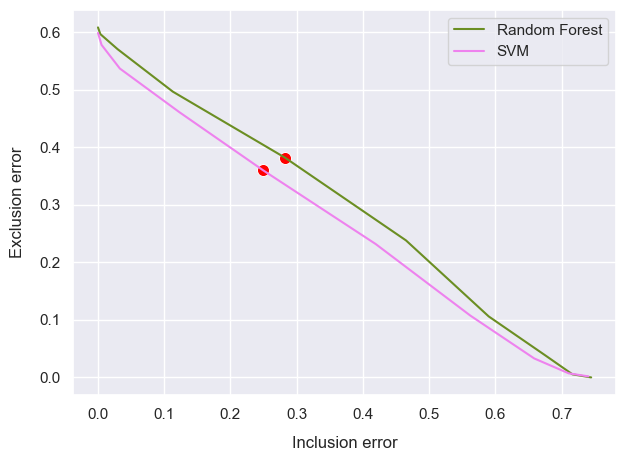

In [42]:
# Compute the inclusion and exclusion error for the RF and the SVM models.

incl_errors_RF = []
excl_errors_RF = []
for t in [0.2, 0.4, 0.6, 0.8, 1, 1.2, 1.4, 1.6, 1.8, 2]:
    true_non_poor = 0
    false_non_poor = 0
    false_poor = 0
    for i in range(0,2700):
        if ierf.y_true[i] > 1 and ierf.y_pred[i] > t:
            true_non_poor+=1
        if ierf.y_true[i] > 1 and ierf.y_pred[i] < t:
            false_poor+=1
        if ierf.y_true[i] < 1 and ierf.y_pred[i] > t:
            false_non_poor+=1
    incl_err = false_poor/(true_poor+false_poor)
    excl_err = false_non_poor/(true_poor+false_non_poor)
    incl_errors_RF.append(incl_err)
    excl_errors_RF.append(excl_err)

incl_errors_SVM = []
excl_errors_SVM = []
for t in [0.2, 0.4, 0.6, 0.8, 1, 1.2, 1.4, 1.6, 1.8, 2]:
    true_non_poor = 0
    false_non_poor = 0
    false_poor = 0
    for i in range(0,2700):
        if iesvm.y_true[i] > 1 and iesvm.y_pred[i] > t:
            true_non_poor += 1
        if iesvm.y_true[i] > 1 and iesvm.y_pred[i] < t:
            false_poor += 1
        if iesvm.y_true[i] < 1 and iesvm.y_pred[i] > t:
            false_non_poor += 1
    incl_err = false_poor/(true_poor+false_poor)
    excl_err = false_non_poor/(true_poor+false_non_poor)
    incl_errors_SVM.append(incl_err)
    excl_errors_SVM.append(excl_err)

# Visualize the results
sns.set()
ax = plt.subplots(figsize = (7,5))

sns.lineplot(x=incl_errors_RF, y=excl_errors_RF, label='Random Forest', color='olivedrab')
sns.lineplot(x=incl_errors_SVM, y=excl_errors_SVM, label='SVM', color= 'violet')

sns.scatterplot(x=[incl_errors_RF[4]], y=[excl_errors_RF[4]], s=75, color='red')
sns.scatterplot(x=[incl_errors_SVM[4]], y=[excl_errors_SVM[4]], s=75, color='red')

plt.xlabel('Inclusion error', labelpad=10)
plt.ylabel('Exclusion error', labelpad=10)
plt.show()

---

# 6. Contribution of features

## 6.1. SVM

In [131]:
# Running time: 1 hour.

# Produce the permutation importance from the SVM model and the test sets.
perm_importance = permutation_importance(imp_model, X_test, y_test)

print(perm_importance)

{'importances_mean': array([ 2.09281371e-03,  4.33132397e-03,  2.17777859e-03,  7.52057079e-03,
        5.57537772e-03,  2.13378155e-03,  2.21599712e-03,  2.37452613e-03,
        1.85127811e-03,  2.21082700e-03,  2.09259663e-01,  3.60512980e-03,
       -4.78787831e-04,  5.04067005e-02,  1.37140606e-02,  1.02472792e-02,
        7.23089329e-04,  1.53563414e-02,  4.24605974e-03,  7.04163340e-03,
        4.08489178e-03,  3.25923831e-03,  7.16469916e-03,  5.03331713e-03,
        8.74218759e-03,  2.22472033e-03,  8.89469903e-03,  2.27572759e-03,
        1.38337640e-01,  2.30117646e-03,  1.99971411e-03, -1.78496603e-04,
        4.93596245e-03,  1.43642725e-02,  3.07852174e-02,  1.81550175e-03,
        4.30939952e-03,  5.81254827e-03,  3.95824477e-03,  2.51803916e-02,
       -5.83945902e-04,  1.02909673e-02,  9.83408964e-03,  3.53530884e-03,
        2.55578072e-03,  5.88895893e-03,  1.94006253e-02,  2.20461198e-03,
        3.89237416e-03, -7.31028715e-04,  1.11445626e-03,  9.84613236e-04,
    

In [143]:
# Create an array with all the columns' names
features_names = list(X.columns)
features = np.array(features_names)

In [183]:
# Create a dataframe with the mean importances and the corresponding variables
importance_df = pd.DataFrame({'variable':features,
                              'gain':perm_importance.importances_mean}) 

# Sort the df by descending gain, and reindex
importance_df.sort_values(by=['gain'], inplace=True, ascending=False)
importance_df = importance_df.reset_index(drop=True)

# Keep only the 10 most important variables
importance_df = importance_df.loc[0:10]

importance_df

,variable,gain
0,nb_people_per_house,0.209260
1,retirement_income,0.138338
2,social_security_type_4,0.059764
3,lived_from_work_earnings,0.050407
4,ESTADO_1,0.044592
5,overcrowding_index,0.030785
6,NIVEL_ED_6,0.025180
7,household_role_3,0.019401
8,lived_from_social_assistance,0.015356
9,age_2,0.014364


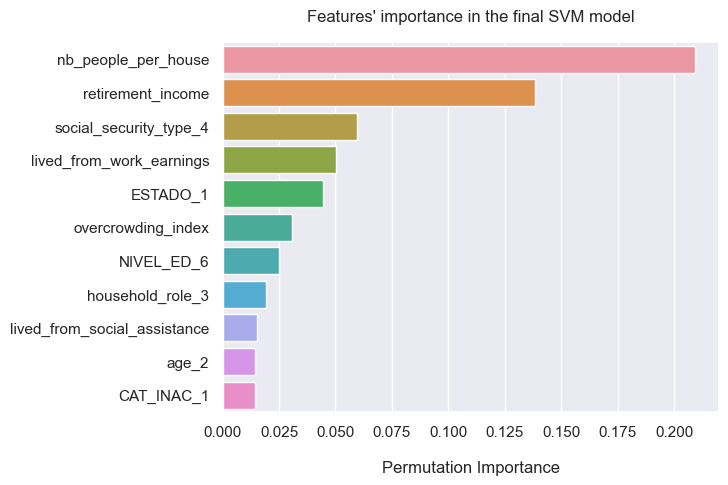

In [190]:
# Display the graph with the 10 most important features
sns.barplot(y=importance_df.variable, x=importance_df.gain)
plt.xlabel('Permutation Importance', labelpad=15)
plt.ylabel(None)
plt.title("Features' importance in the final SVM model", pad=15)
plt.show()

## 6.2. SHAP Values for Random Forest

In [143]:
pip install shap

Note: you may need to restart the kernel to use updated packages.


In [144]:
import shap

In [129]:
# Try to apply Shap kernel explainer on the SVM final model:
explainer = shap.KernelExplainer(imp_model.predict, X_train)

Using 21594 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [156]:
# Add columns labels to the X sets.
X_train_with_columns = pd.DataFrame(X_train, columns=X.columns)
X_test_with_columns = pd.DataFrame(X_test, columns=X.columns)

In [157]:
# Method 2: Explainer.
# Use SHAP values to explain the predictions of the model
explainer = shap.Explainer(regressor_final, X_train_with_columns)
shap_values = explainer(X_test_with_columns)

# print the average SHAP values for each feature
print(shap_values.mean(axis=0))

100%|===================| 2699/2700 [04:47<00:00]        

.values =
array([-9.78068280e-04, -1.68491130e-04,  2.83568638e-06, -2.79433358e-03,
       -5.51330938e-04,  0.00000000e+00,  0.00000000e+00,  6.19150775e-05,
       -1.91855260e-05,  0.00000000e+00,  8.03075665e-03, -5.62523008e-04,
        0.00000000e+00, -8.43859351e-04,  8.97814049e-04,  0.00000000e+00,
        0.00000000e+00,  1.11274753e-03, -2.25385350e-04, -1.12140460e-03,
        2.50576934e-04,  0.00000000e+00,  9.51137725e-07, -4.48172817e-05,
        4.83703570e-04, -6.69950631e-05,  6.65058517e-04,  1.02687444e-04,
        4.18416801e-03,  4.46019073e-04,  3.59387621e-06,  0.00000000e+00,
        1.72479962e-04, -8.54312014e-04,  1.51930224e-02,  8.36298530e-05,
        3.18260464e-04, -2.98275591e-04, -2.60338079e-03,  8.23995618e-03,
        0.00000000e+00,  3.34251211e-04,  3.08568905e-04, -3.11132078e-04,
       -2.88664364e-04,  7.96925724e-04,  2.07214876e-04,  1.27358886e-06,
        0.00000000e+00,  0.00000000e+00, -6.15023940e-07,  0.00000000e+00,
        0.00000

In [158]:
shap.initjs()

### 6.2.1. Global plots

__6.2.1.1 Variable Importance Plot.__ A variable importance plot lists the most significant variables in descending order. The top variables contribute more to the model than the bottom ones and thus have high predictive power.

In [159]:
print(shap_values)

.values =
array([[-2.96627579e-03,  2.43554908e-04,  6.24625645e-06, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 1.88819919e-02,  1.40734050e-03, -1.44617916e-07, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [-1.13021618e-02,  6.00139810e-03, -3.73174098e-05, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       ...,
       [ 2.77917016e-02,  2.93675317e-03,  5.21149439e-06, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [-8.43541311e-03,  2.81299610e-04,  6.77548131e-06, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [-3.39363802e-03, -1.99573019e-04,  5.69613730e-07, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

.base_values =
array([1.25564216, 1.25564216, 1.25564216, ..., 1.25564216, 1.25564216,
       1.25564216])

.data =
array([[-1.088584  , -0.93543291,  0.20767066, ..., -0.03445141,
        -0.1170785 , -0.0495083 ],
       [ 0.98742

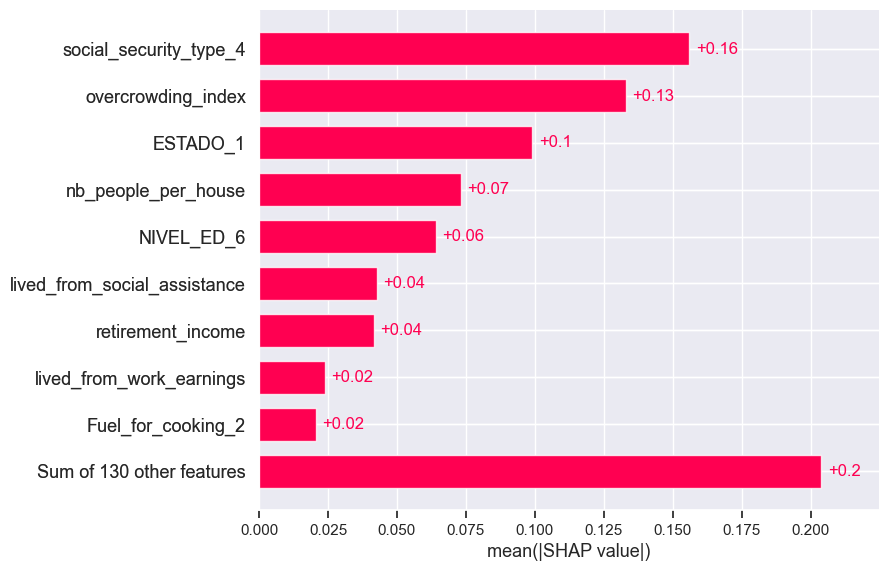

In [161]:
shap.plots.bar(shap_values, max_display=10, order=shap.Explanation.abs, clustering=None, clustering_cutoff=0.5, 
               merge_cohorts=False, show_data='auto', show=True)

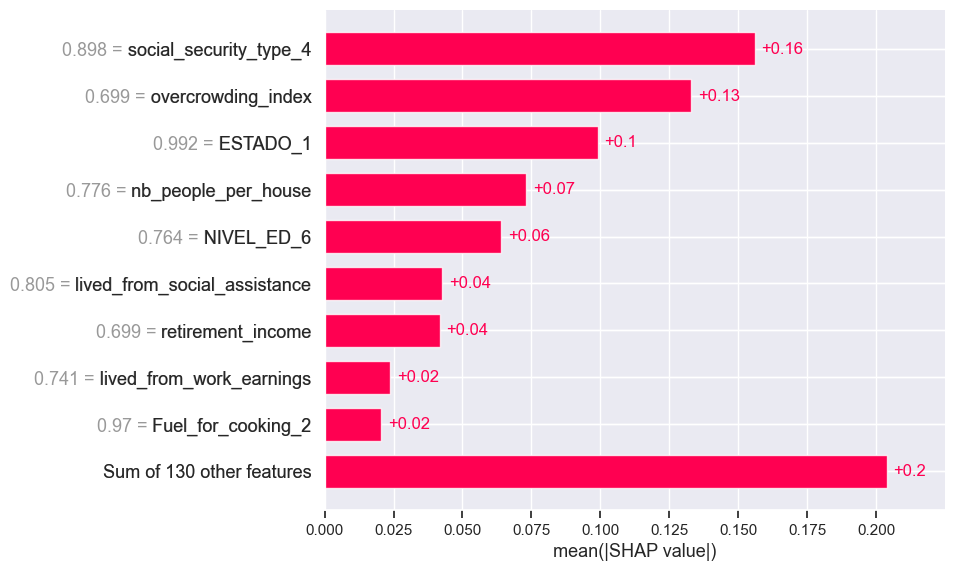

In [162]:
shap.plots.bar(shap_values, show_data=True)

__6.2.1.2 Cohort bar plot.__ Passing a dictionary of Explanation objects will create a multiple-bar plot with one bar type for each of the cohorts represented by the explanation objects. Below we use this to plot a global summary of feature importance separately for men and women.

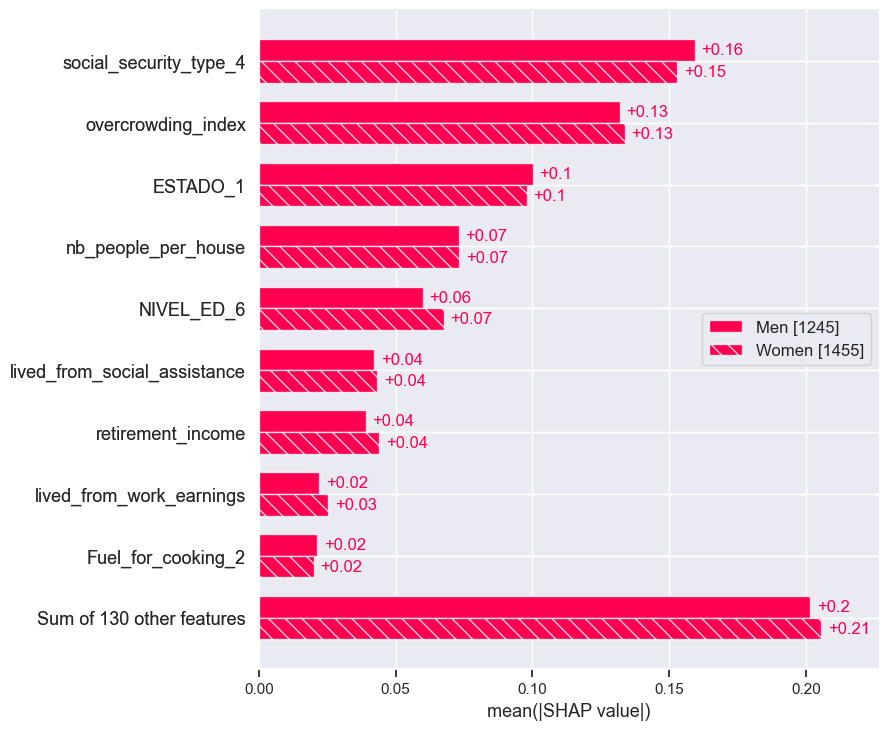

In [182]:
sex = ["Women" if shap_values[i,"sex"].data < 0 else "Men" for i in range(shap_values.shape[0])]
shap.plots.bar(shap_values.cohorts(sex).abs.mean(0))

__6.2.1.3 Beeswarm summary plot.__ The beeswarm plot is designed to display an information-dense summary of how the top features in a dataset impact the model’s output. Each instance the given explanation is represented by a single dot on each feature fow. The x position of the dot is determined by the SHAP value (shap_values.value[instance,feature]) of that feature, and dots “pile up” along each feature row to show density. Color is used to display the original value of a feature (shap_values.data[instance,feature]).

By default the features are ordered using shap_values.abs.mean(0), which is the mean absolute value of the SHAP values for each feature. This order however places more emphasis on broad average impact, and less on rare but high magnitude impacts. If we want to find features with high impacts for individual people we can instead sort by the max absolute value

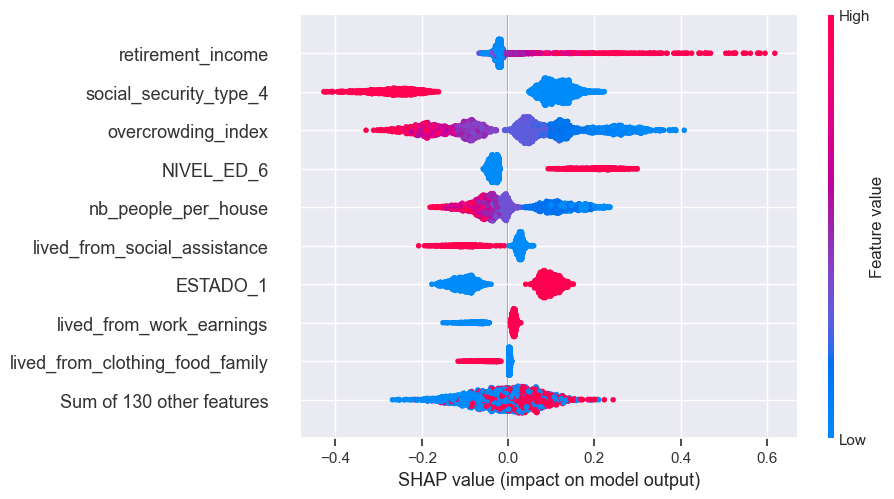

In [165]:
shap.plots.beeswarm(shap_values, order=shap_values.abs.max(0))

 __6.1.4 SHAP Dependence Plot.__ A partial dependence plot shows the marginal effect of one or two features on the predicted outcome of a machine learning model (J. H. Friedman 2001). It tells whether the relationship between the target and a feature is linear, monotonic or more complex. The function automatically includes another variable that your chosen variable interacts most with.
 
A dependence scatter plot shows the effect a single feature has on the predictions made by the model. 
Each dot is a single prediction (row) from the dataset.
The x-axis is the value of the feature (from the X matrix, stored in shap_values.data).
The y-axis is the SHAP value for that feature (stored in shap_values.values), which represents how much knowing that feature’s value changes the output of the model for that sample’s prediction. 
The light grey area at the bottom of the plot is a histogram showing the distribution of data values.

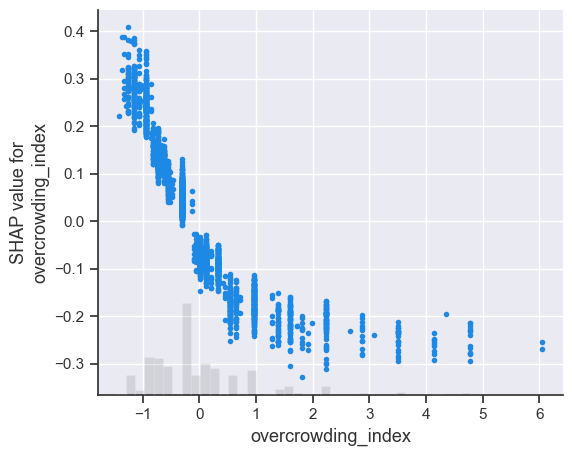

In [185]:
shap.plots.scatter(shap_values[:,"overcrowding_index"])

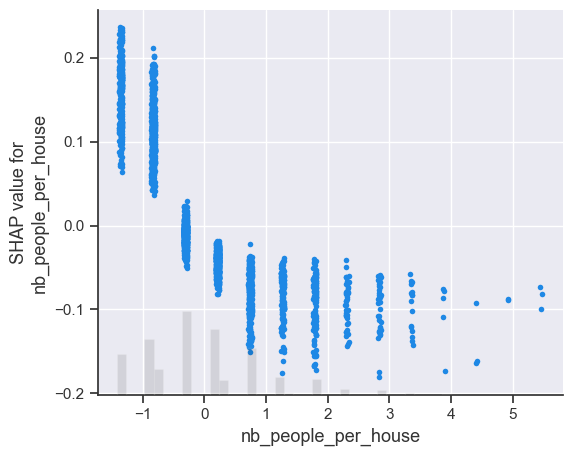

In [188]:
shap.plots.scatter(shap_values[:,"nb_people_per_house"])

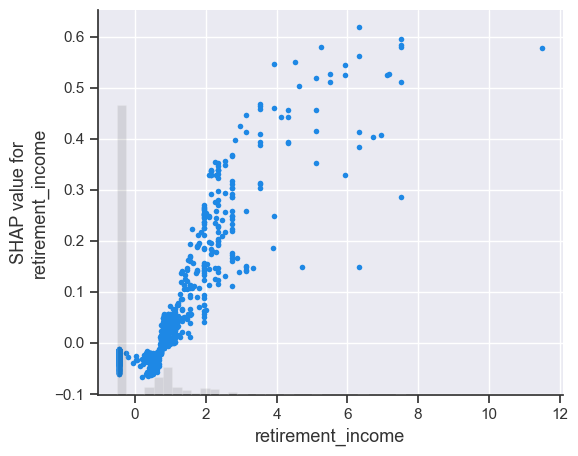

In [189]:
shap.plots.scatter(shap_values[:,"retirement_income"])

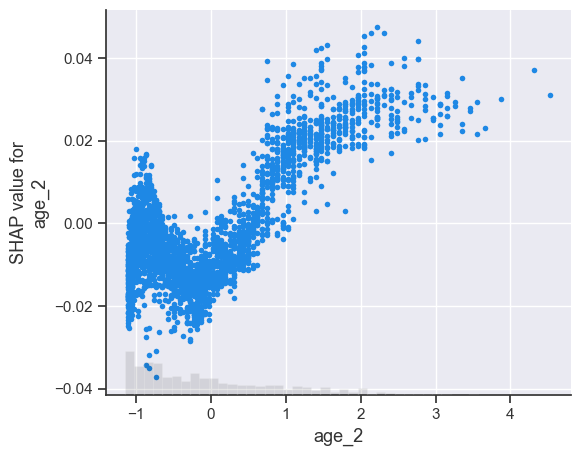

In [186]:
shap.plots.scatter(shap_values[:,"age_2"])

### __6. 2.2. Individual SHAP Value Plots__ 
 
Passing a row of SHAP values to the bar plot function creates a local feature importance plot, where the bars are the SHAP values for each feature. Note that the feature values are show in gray to the left of the feature names.

__6.2.2.1 Force plot for 3 individuals__

In [169]:
# Plot the force plot for individual 0
shap.plots.force(shap_values[0])

In [170]:
# Plot the force plot for individual 1
shap.plots.force(shap_values[1])

In [171]:
# Plot the force plot for individual 6
shap.plots.force(shap_values[6])

__2.2.2 Waterfall plot for 3 individuals__

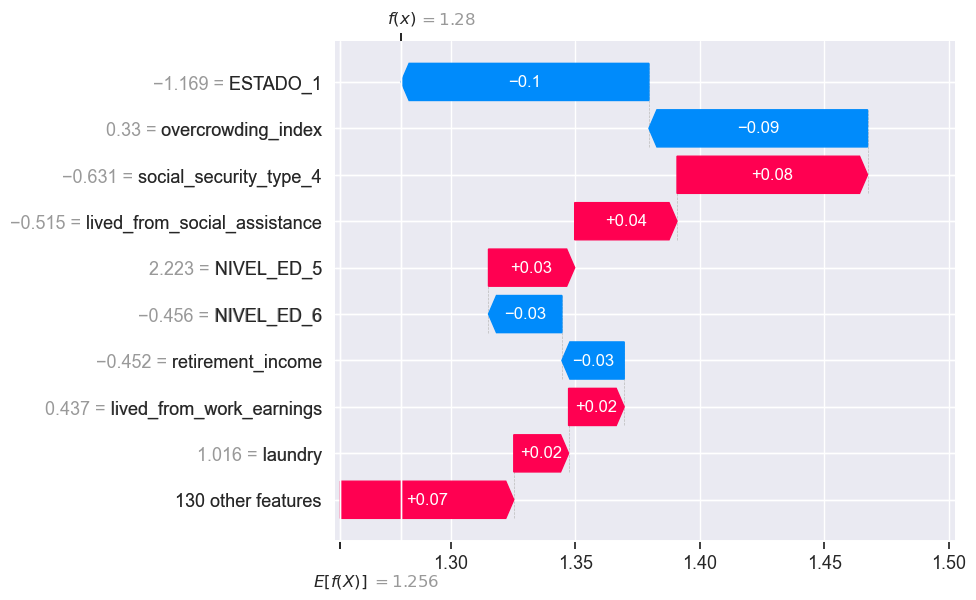

In [172]:
# Plot the waterfall plot for individual 0
shap.plots.waterfall(shap_values[0])

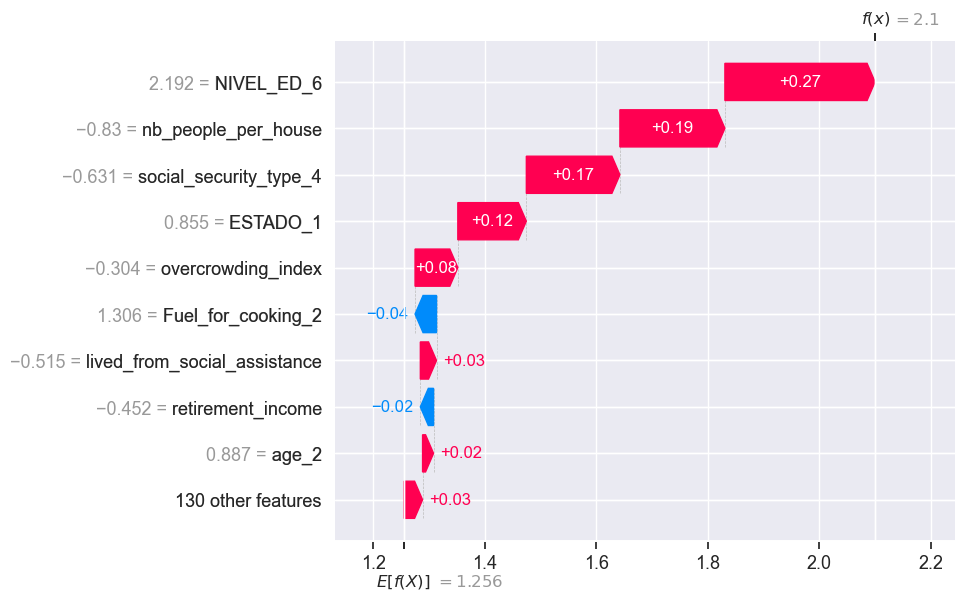

In [173]:
# Plot the waterfall plot for individual 1
shap.plots.waterfall(shap_values[1])

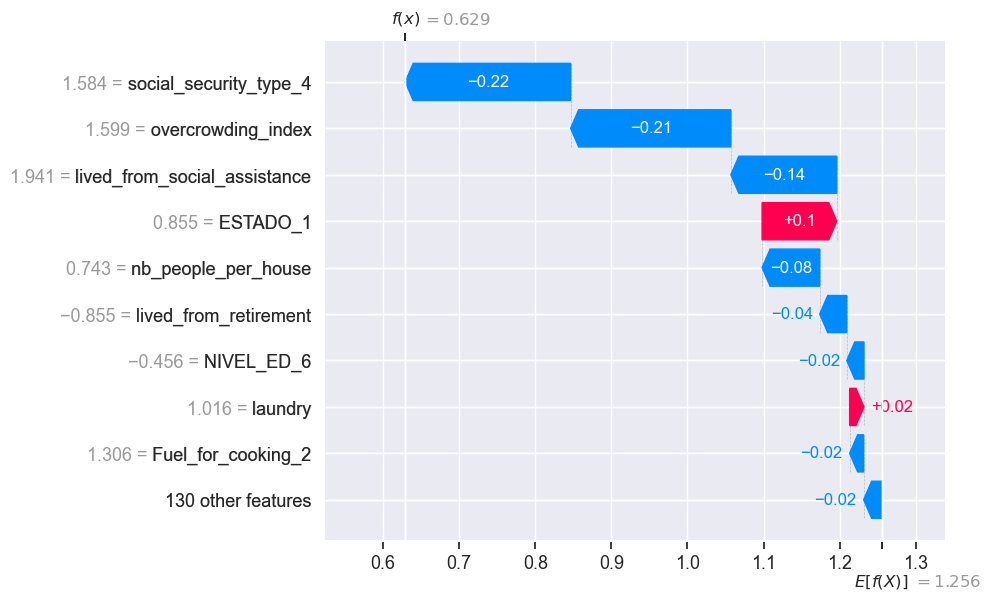

In [174]:
# Plot the waterfall plot for individual 6
shap.plots.waterfall(shap_values[6])